## **Loading the data**

In [ ]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random

import tensorflow as tf
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from keras.metrics import Precision, Recall
from keras.models import Sequential, Model
from keras.layers import Dense,Conv2D,Dropout,Flatten,MaxPooling2D, BatchNormalization,Input, GlobalAveragePooling2D, concatenate
from keras.callbacks import EarlyStopping,ReduceLROnPlateau
from keras.utils import plot_model
from keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix

from keras.applications.inception_v3 import InceptionV3

from sklearn.metrics import classification_report

In [ ]:
base_path = '/content/drive/MyDrive/Untitled folder/canny/'
categories = {  0: "0", 1: "1", 2: "2", 3: "3", 4: "4", 5: "5", 6: "6", 7: "7", 8: "8", 9: "9", 10: "a", 11: "b", 12: "c", 13: "d", 14: "e", 15: "f", 16: "g", 17: "h", 18: "i", 19: "j", 20: "k", 21: "l", 22: "m", 23: "n", 24: "o", 25: "p", 26: "q", 27: "r", 28: "s", 29: "t",30: "u",31: "v",32: "w",33: "x",34: "y",35: "z",}

def add_class_name_prefix(df, col_name):
    df[col_name] = df[col_name].apply(
        lambda x: x[re.search("_", x).start() + 1 : re.search("_", x).start() + 2]
        + "/"
        + x
    )
    return df

filenames_list = []
categories_list = []

for category in categories:
    filenames = os.listdir(base_path + categories[category])
    filenames_list = filenames_list + filenames
    categories_list = categories_list + [category] * len(filenames)

df = pd.DataFrame({"filename": filenames_list, "category": categories_list})
df = add_class_name_prefix(df, "filename")

# Shuffle the dataframe
df = df.sample(frac=1).reset_index(drop=True)

In [ ]:
# train_path = '/kaggle/working/train'
# val_path = '/kaggle/working/val'
# test_path = '/kaggle/working/test'

In [ ]:
IMAGE_WIDTH = 224
IMAGE_HEIGHT = 224
BATCH_SIZE = 32
IMAGE_CHANNELS = 3
IMAGE_SIZE = (IMAGE_WIDTH, IMAGE_HEIGHT)
IMAGE_SHAPE = (IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS)

In [ ]:
df["category"] = df["category"].replace(categories)

train_df, validate_df = train_test_split(df, test_size=0.25, random_state=42)
validate_df, test_df = train_test_split(validate_df, test_size=0.5, random_state=42)

train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

total_train = train_df.shape[0]
total_validate = validate_df.shape[0]
total_test = test_df.shape[0]
print(
    "train size =",
    total_train,
    "validate size =",
    total_validate,
    "test size =",
    test_df.shape[0],
)

train size = 1902 validate size = 317 test size = 317


In [ ]:
train_df, validate_df = train_test_split(df, test_size=0.25, random_state=42)
validate_df, test_df = train_test_split(validate_df, test_size=0.5, random_state=42)

In [ ]:
datagen = image.ImageDataGenerator(rescale = 1.0 / 255)

In [ ]:
train_generator = datagen.flow_from_dataframe(
    train_df,
    base_path,
    x_col="filename",
    y_col="category",
    target_size=IMAGE_SIZE,
    class_mode="categorical",
    batch_size=BATCH_SIZE,
)

validation_generator = datagen.flow_from_dataframe(
    validate_df,
    base_path,
    x_col="filename",
    y_col="category",
    target_size=IMAGE_SIZE,
    class_mode="categorical",
    batch_size=BATCH_SIZE,
)

test_generator = datagen.flow_from_dataframe(
    test_df,
    base_path,
    x_col="filename",
    y_col="category",
    target_size=IMAGE_SIZE,
    color_mode="rgb",
    class_mode="categorical",
    batch_size=1,
    shuffle=False,
)

Found 1902 validated image filenames belonging to 36 classes.
Found 317 validated image filenames belonging to 36 classes.
Found 317 validated image filenames belonging to 36 classes.


In [ ]:
EPOCHS = 50
learning_rate_reduction = ReduceLROnPlateau(
    monitor="val_accuracy", patience=3, verbose=1, factor=0.3, min_lr=0.0000001
)
early_stop = EarlyStopping(
    patience=10,
    verbose=1,
    monitor="val_accuracy",
    mode="max",
    min_delta=0.001,
    restore_best_weights=True,
)

In [ ]:
STEP_SIZE_TRAIN = train_generator.n // train_generator.batch_size
STEP_SIZE_VALID = validation_generator.n // validation_generator.batch_size

## **SqueezeNet**

In [ ]:
bnmomemtum = 0.9

def fire_module(x, squeeze, expand):
    y = Conv2D(filters=squeeze, kernel_size=1, activation="relu", padding="same")(x)
    y = BatchNormalization(momentum=bnmomemtum)(y)
    y1 = Conv2D(filters=expand // 2, kernel_size=1, activation="relu", padding="same")(y)
    y1 = BatchNormalization(momentum=bnmomemtum)(y1)
    y3 = Conv2D(filters=expand // 2, kernel_size=3, activation="relu", padding="same")(y)
    y3 = BatchNormalization(momentum=bnmomemtum)(y3)
    return concatenate([y1, y3])

def SqueezeNet(input_shape, num_classes):
    input = Input(shape=input_shape)
    y = Conv2D(kernel_size=7, filters=96, strides=2, padding="same", activation="relu")(input)
    y = BatchNormalization(momentum=bnmomemtum)(y)
    y = MaxPooling2D(pool_size=3, strides=2)(y)
    y = fire_module(y, 16, 64)
    y = fire_module(y, 16, 64)
    y = fire_module(y, 32, 128)
    y = MaxPooling2D(pool_size=3, strides=2)(y)
    y = fire_module(y, 32, 128)
    y = fire_module(y, 48, 192)
    y = fire_module(y, 48, 192)
    y = fire_module(y, 64, 256)
    y = MaxPooling2D(pool_size=2)(y)
    y = fire_module(y, 64, 256)
    y = Conv2D(kernel_size=1, filters=1000, strides=1, padding="same", activation="relu")(y)
    y = GlobalAveragePooling2D()(y)
    y = Dense(num_classes, activation="softmax")(y)
    model = Model(input, y)
    return model

In [ ]:
squeezenet_model = SqueezeNet(
    input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_CHANNELS), num_classes=len(categories)
)
squeezenet_model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
squeezenet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 112, 112, 96)         14208     ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 112, 112, 96)         384       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 55, 55, 96)           0         ['batch_normalization[0][0

In [ ]:
squeezenet_history = squeezenet_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 1874s 31s/step - loss: 2.6748 - accuracy: 0.2262 - val_loss: 6.2673 - val_accuracy: 0.0799 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 10s 166ms/step - loss: 1.4099 - accuracy: 0.5455 - val_loss: 3.3921 - val_accuracy: 0.2500 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 9s 147ms/step - loss: 0.9476 - accuracy: 0.6856 - val_loss: 1.5298 - val_accuracy: 0.5312 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 10s 161ms/step - loss: 0.7162 - accuracy: 0.7561 - val_loss: 3.8787 - val_accuracy: 0.2708 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 10s 163ms/step - loss: 0.5804 - accuracy: 0.8075 - val_loss: 0.6562 - val_accuracy: 0.8021 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 8s 141ms/step - loss: 0.4411 - accuracy: 0.8556 - val_loss: 0.9327 - val_accuracy: 0.6528 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 10s 170ms/step

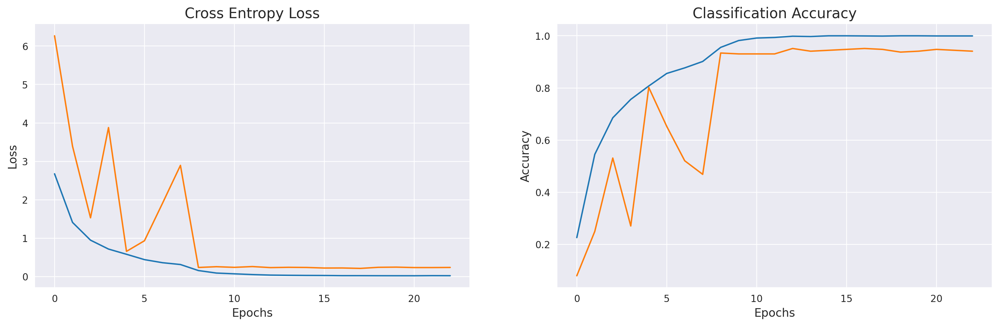

In [ ]:
error = pd.DataFrame(squeezenet_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = squeezenet_model.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = squeezenet_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       0.78      0.47      0.58        15
           1       1.00      0.86      0.92        14
           2       0.80      0.89      0.84         9
           3       1.00      1.00      1.00        11
           4       0.75      1.00      0.86         3
           5       1.00      0.90      0.95        10
           6       0.67      0.33      0.44         6
           7       1.00      0.88      0.93         8
           8       0.90      1.00      0.95         9
           9       1.00      1.00      1.00        12
           a       1.00      1.00      1.00         6
           b       0.83      1.00      0.91         5
           c       0.92      1.00      0.96        12
           d       0.82      1.00      0.90         9
           e       0.91      1.00      0.95        10
           f       1.00      0.88      0.93         8
           g       0.89      0.89      0.89         9
     

## **InceptionV3**

In [ ]:
pre_trained = InceptionV3(weights='imagenet', include_top=False, input_shape=IMAGE_SHAPE, pooling='avg')

for layer in pre_trained.layers:
    layer.trainable = False

87910968/87910968 [==============================] - 5s 0us/step


In [ ]:
x = pre_trained.output
x = BatchNormalization()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.2)(x)
predictions = Dense(36, activation='softmax')(x)

inception_model = Model(inputs = pre_trained.input, outputs = predictions)
inception_model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
inception_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_26 (Conv2D)          (None, 111, 111, 32)         864       ['input_2[0][0]']             
                                                                                                  
 batch_normalization_25 (Ba  (None, 111, 111, 32)         96        ['conv2d_26[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation (Activation)     (None, 111, 111, 32)         0         ['batch_normalization_25

In [ ]:
inception_history = inception_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 26s 238ms/step - loss: 1.6921 - accuracy: 0.5957 - val_loss: 1.3099 - val_accuracy: 0.6146 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 9s 150ms/step - loss: 0.2508 - accuracy: 0.9299 - val_loss: 0.8633 - val_accuracy: 0.7535 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 9s 152ms/step - loss: 0.1002 - accuracy: 0.9663 - val_loss: 0.5676 - val_accuracy: 0.8333 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 9s 155ms/step - loss: 0.0676 - accuracy: 0.9807 - val_loss: 0.6275 - val_accuracy: 0.8194 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 8s 142ms/step - loss: 0.0592 - accuracy: 0.9829 - val_loss: 0.5562 - val_accuracy: 0.8576 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 9s 147ms/step - loss: 0.0422 - accuracy: 0.9850 - val_loss: 0.6406 - val_accuracy: 0.8507 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 10s 161ms/step - 

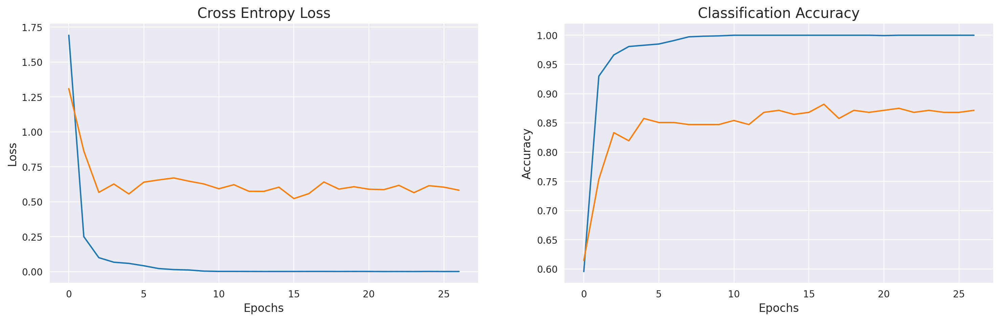

In [ ]:
error = pd.DataFrame(inception_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = inception_model.predict(test_generator,verbose = 0)

y_pred = np.argmax(result, axis = 1)

y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = inception_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       0.62      0.53      0.57        15
           1       1.00      0.86      0.92        14
           2       0.64      0.78      0.70         9
           3       1.00      0.91      0.95        11
           4       0.43      1.00      0.60         3
           5       1.00      0.90      0.95        10
           6       1.00      0.83      0.91         6
           7       0.89      1.00      0.94         8
           8       1.00      0.89      0.94         9
           9       0.92      0.92      0.92        12
           a       1.00      0.83      0.91         6
           b       0.83      1.00      0.91         5
           c       1.00      0.83      0.91        12
           d       1.00      1.00      1.00         9
           e       0.71      1.00      0.83        10
           f       1.00      0.88      0.93         8
           g       0.90      1.00      0.95         9
     

## **Xception**

In [ ]:
xcept = tf.keras.applications.Xception(weights = 'imagenet',
                                    include_top = False,
                                    input_shape = (224, 224, 3))

for layer in xcept.layers[:-5]:
    layer.trainable = False

83683744/83683744 [==============================] - 5s 0us/step


In [ ]:
x = xcept.output
x = Flatten()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = BatchNormalization()(x)
prediction = Dense(36, activation='softmax')(x)
xception_model = Model(xcept.input, prediction)
xception_model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
xception_model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 111, 111, 32)         864       ['input_3[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, 111, 111, 32)         128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activati  (None, 111, 111, 32)         0         ['block1_conv1_bn[0][0]'

In [ ]:
xception_history = xception_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 27s 324ms/step - loss: 1.7941 - accuracy: 0.5187 - val_loss: 1.5502 - val_accuracy: 0.5972 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 14s 227ms/step - loss: 0.4544 - accuracy: 0.8717 - val_loss: 1.4490 - val_accuracy: 0.5799 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 15s 246ms/step - loss: 0.1910 - accuracy: 0.9545 - val_loss: 0.6262 - val_accuracy: 0.7917 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 14s 228ms/step - loss: 0.0888 - accuracy: 0.9802 - val_loss: 0.3590 - val_accuracy: 0.9028 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 13s 222ms/step - loss: 0.0502 - accuracy: 0.9882 - val_loss: 0.2524 - val_accuracy: 0.9201 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 13s 213ms/step - loss: 0.0285 - accuracy: 0.9936 - val_loss: 0.2591 - val_accuracy: 0.9340 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 13s 218ms/st

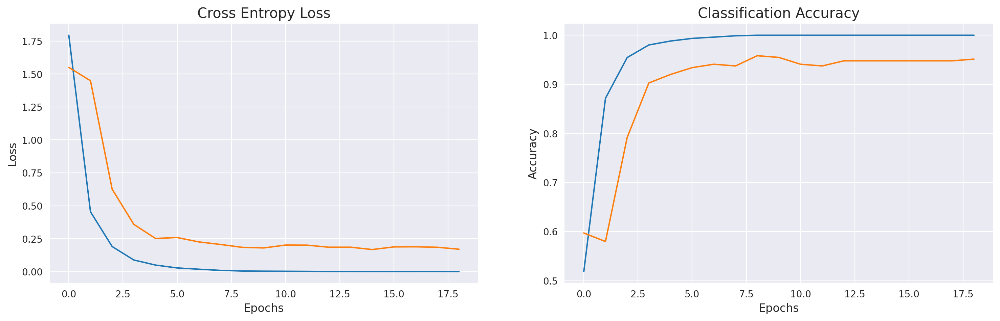

In [ ]:
error = pd.DataFrame(xception_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = xception_model.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = xception_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       0.91      0.67      0.77        15
           1       1.00      0.86      0.92        14
           2       0.89      0.89      0.89         9
           3       1.00      1.00      1.00        11
           4       1.00      1.00      1.00         3
           5       1.00      1.00      1.00        10
           6       0.60      1.00      0.75         6
           7       0.89      1.00      0.94         8
           8       1.00      0.89      0.94         9
           9       1.00      1.00      1.00        12
           a       0.71      0.83      0.77         6
           b       1.00      1.00      1.00         5
           c       1.00      1.00      1.00        12
           d       1.00      1.00      1.00         9
           e       1.00      1.00      1.00        10
           f       1.00      1.00      1.00         8
           g       1.00      1.00      1.00         9
     

## **VGG16**

In [ ]:
vgg = tf.keras.applications.VGG16(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet')

vgg.trainable = False
# for layer in model.layers[:-5]:
#     layer.trainable = False

vgg.summary()

58889256/58889256 [==============================] - 4s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [ ]:
vgg16_model = Sequential([
    vgg,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
vgg16_model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
vgg16_history = vgg16_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 24s 254ms/step - loss: 1.4738 - accuracy: 0.6963 - val_loss: 1.2227 - val_accuracy: 0.8472 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 10s 159ms/step - loss: 0.1415 - accuracy: 0.9556 - val_loss: 0.7193 - val_accuracy: 0.8785 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 11s 181ms/step - loss: 0.0238 - accuracy: 0.9936 - val_loss: 0.3625 - val_accuracy: 0.9549 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 11s 185ms/step - loss: 0.0055 - accuracy: 0.9995 - val_loss: 0.2283 - val_accuracy: 0.9653 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 10s 162ms/step - loss: 0.0028 - accuracy: 0.9995 - val_loss: 0.1837 - val_accuracy: 0.9618 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 10s 161ms/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 0.1589 - val_accuracy: 0.9618 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - ETA: 0s - lo

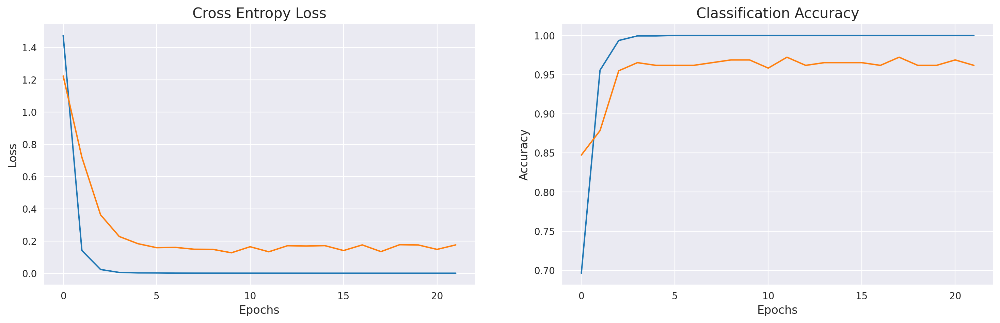

In [ ]:
error = pd.DataFrame(vgg16_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = vgg16_model.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = vgg16_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       0.82      0.93      0.87        15
           1       1.00      0.93      0.96        14
           2       1.00      1.00      1.00         9
           3       1.00      1.00      1.00        11
           4       0.75      1.00      0.86         3
           5       1.00      1.00      1.00        10
           6       1.00      1.00      1.00         6
           7       1.00      1.00      1.00         8
           8       1.00      1.00      1.00         9
           9       1.00      1.00      1.00        12
           a       1.00      0.83      0.91         6
           b       1.00      1.00      1.00         5
           c       1.00      1.00      1.00        12
           d       1.00      1.00      1.00         9
           e       1.00      1.00      1.00        10
           f       1.00      1.00      1.00         8
           g       1.00      1.00      1.00         9
     

## **VGG19**

In [ ]:
vgg19 = tf.keras.applications.VGG19(
    input_shape = (224, 224, 3),
    include_top = False,
    weights = 'imagenet')

vgg19.trainable = False
# for layer in model.layers[:-5]:
#     layer.trainable = False

vgg19.summary()

80134624/80134624 [==============================] - 5s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                              

In [ ]:
vgg19_model = Sequential([
    vgg19,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
vgg19_model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
vgg19_history = vgg19_model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 14s 212ms/step - loss: 1.7626 - accuracy: 0.6898 - val_loss: 1.1997 - val_accuracy: 0.8125 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 11s 190ms/step - loss: 0.1241 - accuracy: 0.9663 - val_loss: 0.6550 - val_accuracy: 0.9306 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 12s 206ms/step - loss: 0.0324 - accuracy: 0.9904 - val_loss: 0.4097 - val_accuracy: 0.9271 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 11s 186ms/step - loss: 0.0417 - accuracy: 0.9866 - val_loss: 0.3182 - val_accuracy: 0.9479 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 11s 190ms/step - loss: 0.0190 - accuracy: 0.9963 - val_loss: 0.2068 - val_accuracy: 0.9653 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 12s 205ms/step - loss: 0.0035 - accuracy: 1.0000 - val_loss: 0.1341 - val_accuracy: 0.9757 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 11s 185ms/st

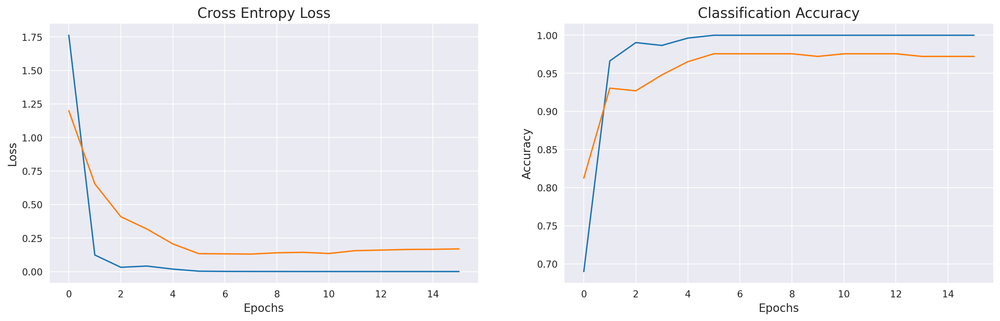

In [ ]:
error = pd.DataFrame(vgg19_history.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = vgg19_model.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = vgg19_model.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

Classification Report
              precision    recall  f1-score   support

           0       0.88      0.93      0.90        15
           1       1.00      1.00      1.00        14
           2       1.00      0.89      0.94         9
           3       1.00      1.00      1.00        11
           4       1.00      1.00      1.00         3
           5       1.00      1.00      1.00        10
           6       0.86      1.00      0.92         6
           7       1.00      1.00      1.00         8
           8       1.00      1.00      1.00         9
           9       1.00      1.00      1.00        12
           a       1.00      0.83      0.91         6
           b       1.00      1.00      1.00         5
           c       1.00      1.00      1.00        12
           d       1.00      1.00      1.00         9
           e       1.00      1.00      1.00        10
           f       1.00      1.00      1.00         8
           g       1.00      1.00      1.00         9
     

## **ResNet50**

In [ ]:
resnet = tf.keras.applications.ResNet50(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
resnet.summary()

94765736/94765736 [==============================] - 5s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_6[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                      

In [ ]:
model_50 = Sequential([
    resnet,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_50.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_50 = model_50.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 65s 445ms/step - loss: 3.3220 - accuracy: 0.6342 - val_loss: 179.6851 - val_accuracy: 0.0347 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 23s 383ms/step - loss: 0.4056 - accuracy: 0.8952 - val_loss: 42.6356 - val_accuracy: 0.0174 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 22s 364ms/step - loss: 0.3381 - accuracy: 0.9150 - val_loss: 168.4586 - val_accuracy: 0.0174 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - ETA: 0s - loss: 0.2538 - accuracy: 0.9305
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
59/59 [==============================] - 22s 368ms/step - loss: 0.2538 - accuracy: 0.9305 - val_loss: 4.7819 - val_accuracy: 0.0347 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 22s 369ms/step - loss: 0.0889 - accuracy: 0.9733 - val_loss: 5.2775 - val_accuracy: 0.0139 - lr: 3.0000e-04
Epoch 6/50
59/59 [==============================] - 

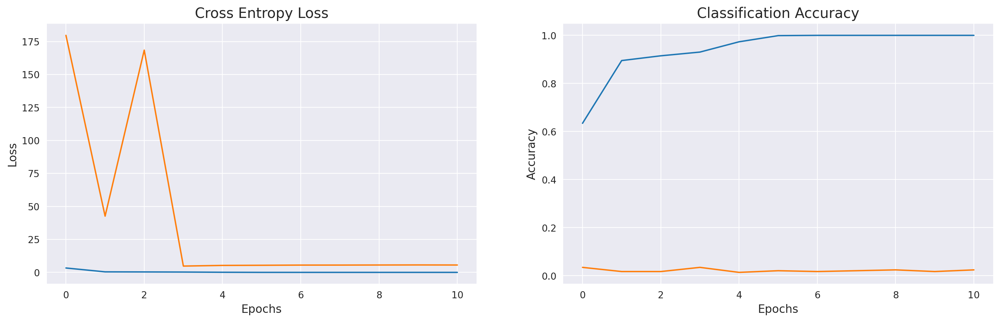

In [ ]:
error = pd.DataFrame(history_50.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = model_50.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_50.evaluate(test_generator,verbose = 0)

print('Accuracy:',acc*100)
print('Loss:',loss)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

Classification Report
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        15
           1       0.00      0.00      0.00        14
           2       0.00      0.00      0.00         9
           3       0.00      0.00      0.00        11
           4       0.00      0.00      0.00         3
           5       0.00      0.00      0.00        10
           6       0.00      0.00      0.00         6
           7       0.00      0.00      0.00         8
           8       0.00      0.00      0.00         9
           9       0.00      0.00      0.00        12
           a       0.00      0.00      0.00         6
           b       0.00      0.00      0.00         5
           c       0.00      0.00      0.00        12
           d       0.00      0.00      0.00         9
           e       0.00      0.00      0.00        10
           f       0.00      0.00      0.00         8
           g       0.00      0.00      0.00         9
     

## **ResNet50V2**

In [ ]:
resnetv2 = tf.keras.applications.ResNet50V2(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
resnetv2.summary()

94668760/94668760 [==============================] - 5s 0us/step
Model: "resnet50v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_7[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                        

In [ ]:
model_50v2 = Sequential([
    resnetv2,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_50v2.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_50v2 = model_50v2.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 53s 399ms/step - loss: 2.0000 - accuracy: 0.6118 - val_loss: 932.8538 - val_accuracy: 0.0104 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 19s 326ms/step - loss: 0.5948 - accuracy: 0.8610 - val_loss: 111.9394 - val_accuracy: 0.0139 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 19s 326ms/step - loss: 0.3827 - accuracy: 0.8947 - val_loss: 1.4320 - val_accuracy: 0.6354 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 19s 325ms/step - loss: 0.1467 - accuracy: 0.9551 - val_loss: 1.6113 - val_accuracy: 0.7049 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 19s 326ms/step - loss: 0.0662 - accuracy: 0.9813 - val_loss: 0.4373 - val_accuracy: 0.8681 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 19s 328ms/step - loss: 0.0880 - accuracy: 0.9818 - val_loss: 0.3973 - val_accuracy: 0.9062 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 21s 347m

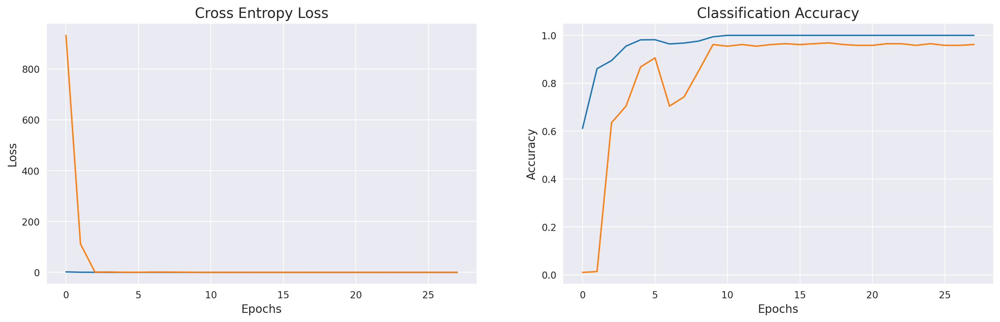

In [ ]:
error = pd.DataFrame(history_50v2.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = model_50v2.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_50v2.evaluate(test_generator,verbose = 0)
print('The accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

Classification Report
              precision    recall  f1-score   support

           0       0.93      0.87      0.90        15
           1       1.00      1.00      1.00        14
           2       1.00      0.89      0.94         9
           3       1.00      1.00      1.00        11
           4       1.00      1.00      1.00         3
           5       0.91      1.00      0.95        10
           6       1.00      1.00      1.00         6
           7       1.00      1.00      1.00         8
           8       1.00      1.00      1.00         9
           9       1.00      1.00      1.00        12
           a       1.00      0.83      0.91         6
           b       1.00      1.00      1.00         5
           c       1.00      1.00      1.00        12
           d       1.00      1.00      1.00         9
           e       1.00      1.00      1.00        10
           f       1.00      1.00      1.00         8
           g       1.00      1.00      1.00         9
     

## **InceptionResNetV2**

In [ ]:
irv2 = tf.keras.applications.InceptionResNetV2(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
irv2.summary()

219055592/219055592 [==============================] - 10s 0us/step
Model: "inception_resnet_v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_8 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_124 (Conv2D)         (None, 111, 111, 32)         864       ['input_8[0][0]']             
                                                                                                  
 batch_normalization_129 (B  (None, 111, 111, 32)         96        ['conv2d_124[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_

In [ ]:
model_irv2 = Sequential([
    resnetv2,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_irv2.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_irv2 = model_irv2.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 49s 342ms/step - loss: 1.5723 - accuracy: 0.7021 - val_loss: 419.1072 - val_accuracy: 0.0312 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 19s 320ms/step - loss: 0.3520 - accuracy: 0.9171 - val_loss: 60.9676 - val_accuracy: 0.2118 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 20s 340ms/step - loss: 0.2475 - accuracy: 0.9417 - val_loss: 138.4985 - val_accuracy: 0.0903 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 19s 322ms/step - loss: 0.2309 - accuracy: 0.9476 - val_loss: 17.5926 - val_accuracy: 0.2778 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 19s 326ms/step - loss: 0.2137 - accuracy: 0.9519 - val_loss: 17.5529 - val_accuracy: 0.4931 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 19s 319ms/step - loss: 1.1125 - accuracy: 0.8497 - val_loss: 354.1097 - val_accuracy: 0.0625 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 19s

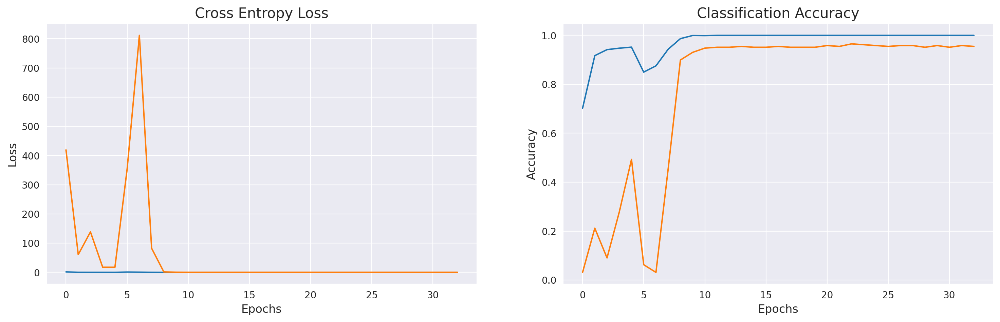

In [ ]:
error = pd.DataFrame(history_irv2.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = model_irv2.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_irv2.evaluate(test_generator,verbose = 0)
print('The accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

Classification Report
              precision    recall  f1-score   support

           0       1.00      0.67      0.80        15
           1       1.00      0.86      0.92        14
           2       0.89      0.89      0.89         9
           3       1.00      0.91      0.95        11
           4       0.75      1.00      0.86         3
           5       1.00      1.00      1.00        10
           6       0.86      1.00      0.92         6
           7       1.00      1.00      1.00         8
           8       1.00      1.00      1.00         9
           9       1.00      1.00      1.00        12
           a       0.83      0.83      0.83         6
           b       1.00      1.00      1.00         5
           c       1.00      1.00      1.00        12
           d       1.00      1.00      1.00         9
           e       1.00      1.00      1.00        10
           f       1.00      1.00      1.00         8
           g       1.00      1.00      1.00         9
     

## **MobileNet**

In [ ]:
mnet = tf.keras.applications.MobileNet(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
mnet.summary()

17225924/17225924 [==============================] - 2s 0us/step
Model: "mobilenet_1.00_224"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizati  (None, 112, 112, 32)      128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, 112, 112, 32)      288       
 )                                                               
                                                 

In [ ]:
model_mnet = Sequential([
    mnet,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_mnet.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_mnet = model_mnet.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 25s 175ms/step - loss: 2.2238 - accuracy: 0.6305 - val_loss: 468.9471 - val_accuracy: 0.0243 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 10s 172ms/step - loss: 0.4009 - accuracy: 0.8952 - val_loss: 54.1855 - val_accuracy: 0.1215 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 10s 175ms/step - loss: 0.4364 - accuracy: 0.9005 - val_loss: 14.0844 - val_accuracy: 0.4375 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 8s 133ms/step - loss: 0.5044 - accuracy: 0.8920 - val_loss: 1.2433 - val_accuracy: 0.8160 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 10s 162ms/step - loss: 0.3994 - accuracy: 0.8989 - val_loss: 1.1824 - val_accuracy: 0.8264 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 9s 159ms/step - loss: 0.1896 - accuracy: 0.9529 - val_loss: 1.0071 - val_accuracy: 0.8194 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 8s 142ms/s

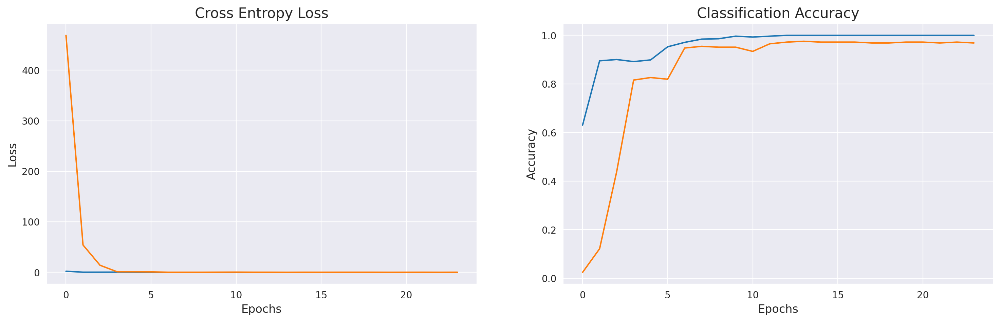

In [ ]:
error = pd.DataFrame(history_mnet.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = model_mnet.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_mnet.evaluate(test_generator,verbose = 0)

print('The accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

Classification Report
              precision    recall  f1-score   support

           0       0.93      0.87      0.90        15
           1       1.00      0.86      0.92        14
           2       1.00      1.00      1.00         9
           3       1.00      1.00      1.00        11
           4       1.00      1.00      1.00         3
           5       1.00      1.00      1.00        10
           6       0.75      1.00      0.86         6
           7       1.00      1.00      1.00         8
           8       1.00      1.00      1.00         9
           9       1.00      0.92      0.96        12
           a       1.00      1.00      1.00         6
           b       0.83      1.00      0.91         5
           c       0.92      1.00      0.96        12
           d       0.90      1.00      0.95         9
           e       0.91      1.00      0.95        10
           f       0.80      1.00      0.89         8
           g       1.00      1.00      1.00         9
     

## **MobileNetV2**

In [ ]:
mnetv2 = tf.keras.applications.MobileNetV2(
    weights = 'imagenet',
    include_top = False,
    input_shape = (224,224,3)
)
mnetv2.summary()

9406464/9406464 [==============================] - 1s 0us/step
Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_10 (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_10[0][0]']            
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReL

In [ ]:
model_mnetv2 = Sequential([
    mnetv2,
    BatchNormalization(),
    Flatten(),
    Dense(256, activation='relu'),
    Dense(36, activation='softmax')
])
model_mnetv2.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history_mnetv2 = model_mnetv2.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=total_validate // BATCH_SIZE,
    steps_per_epoch=total_train // BATCH_SIZE,
    callbacks=[learning_rate_reduction, early_stop],
)

Epoch 1/50
59/59 [==============================] - 67s 278ms/step - loss: 2.5333 - accuracy: 0.6080 - val_loss: 843.8538 - val_accuracy: 0.0243 - lr: 0.0010
Epoch 2/50
59/59 [==============================] - 16s 266ms/step - loss: 0.5892 - accuracy: 0.8631 - val_loss: 795.2170 - val_accuracy: 0.0243 - lr: 0.0010
Epoch 3/50
59/59 [==============================] - 13s 225ms/step - loss: 0.4981 - accuracy: 0.8791 - val_loss: 975.7069 - val_accuracy: 0.0451 - lr: 0.0010
Epoch 4/50
59/59 [==============================] - 13s 219ms/step - loss: 0.6111 - accuracy: 0.8856 - val_loss: 710.5079 - val_accuracy: 0.0590 - lr: 0.0010
Epoch 5/50
59/59 [==============================] - 15s 243ms/step - loss: 0.7228 - accuracy: 0.8545 - val_loss: 275.8311 - val_accuracy: 0.1146 - lr: 0.0010
Epoch 6/50
59/59 [==============================] - 10s 160ms/step - loss: 0.4868 - accuracy: 0.8781 - val_loss: 557.8773 - val_accuracy: 0.0694 - lr: 0.0010
Epoch 7/50
59/59 [==============================] - 

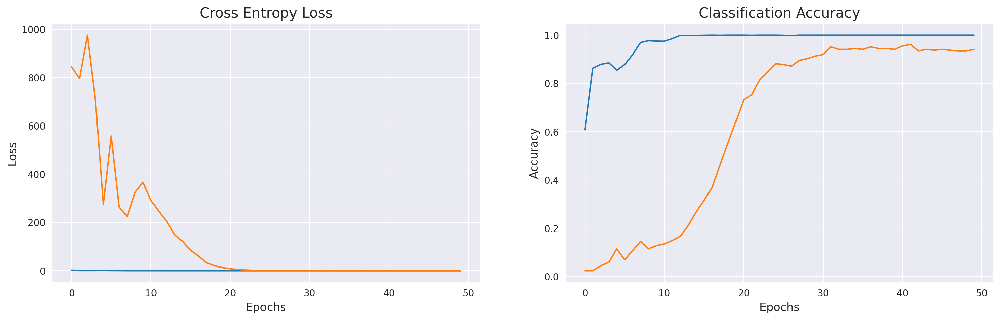

In [ ]:
error = pd.DataFrame(history_mnetv2.history)

plt.figure(figsize=(18,5),dpi=200)
sns.set_style('darkgrid')

plt.subplot(121)
plt.title('Cross Entropy Loss',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Loss',fontsize=12)
plt.plot(error['loss'])
plt.plot(error['val_loss'])

plt.subplot(122)
plt.title('Classification Accuracy',fontsize=15)
plt.xlabel('Epochs',fontsize=12)
plt.ylabel('Accuracy',fontsize=12)
plt.plot(error['accuracy'])
plt.plot(error['val_accuracy'])

plt.show()

In [ ]:
result = model_mnetv2.predict(test_generator,verbose = 0)
y_pred = np.argmax(result, axis = 1)
y_true = test_generator.labels

classes = list(train_generator.class_indices.keys())
clf_rep = classification_report(test_generator.classes, y_pred, target_names=classes, output_dict=True)

precision = [clf_rep[class_name]['precision'] for class_name in classes]
recall = [clf_rep[class_name]['recall'] for class_name in classes]
f1_score = [clf_rep[class_name]['f1-score'] for class_name in classes]

print('Classification Report')
print(classification_report(test_generator.classes, y_pred, target_names=classes))

loss,acc = model_mnetv2.evaluate(test_generator,verbose = 0)

print('The accuracy of the model for testing data is:',acc*100)
print('The Loss of the model for testing data is:',loss)

Classification Report
              precision    recall  f1-score   support

           0       0.90      0.60      0.72        15
           1       1.00      0.93      0.96        14
           2       1.00      0.89      0.94         9
           3       1.00      1.00      1.00        11
           4       1.00      1.00      1.00         3
           5       1.00      1.00      1.00        10
           6       0.75      1.00      0.86         6
           7       1.00      1.00      1.00         8
           8       1.00      1.00      1.00         9
           9       1.00      1.00      1.00        12
           a       1.00      1.00      1.00         6
           b       1.00      1.00      1.00         5
           c       1.00      1.00      1.00        12
           d       0.90      1.00      0.95         9
           e       1.00      1.00      1.00        10
           f       1.00      1.00      1.00         8
           g       1.00      1.00      1.00         9
     

## **Prediction**

In [ ]:
class_map = train_generator.class_indices
classes = []
for key in class_map.keys():
    classes.append(key)

In [ ]:
def predict_image(filename, model):
    img_ = image.load_img(filename, target_size=(224, 224))
    img_array = image.img_to_array(img_)
    img_processed = np.expand_dims(img_array, axis=0)
    img_processed /= 255.

    prediction = model.predict(img_processed)

    index = np.argmax(prediction)

    plt.title("Prediction - {}".format(str(classes[index]).title()), size=18, color='red')
    plt.imshow(img_array)

# **SqueezeNet**

In [ ]:
model = squeezenet_model

1/1 [==============================] - 1s 675ms/step


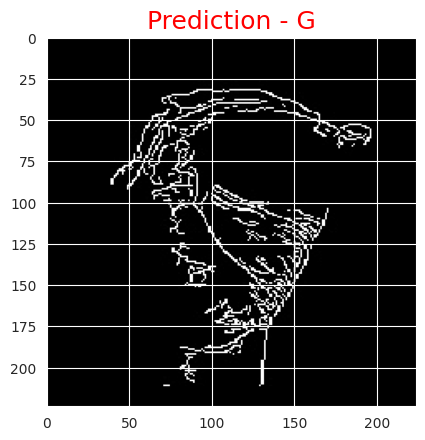

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 37ms/step


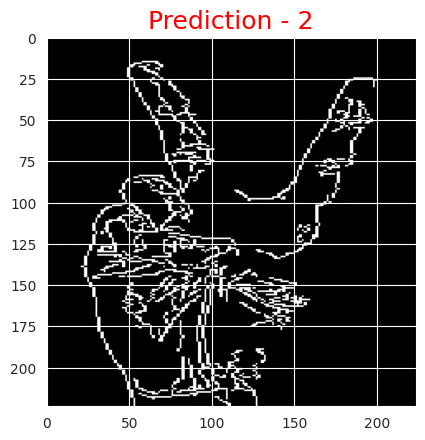

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 26ms/step


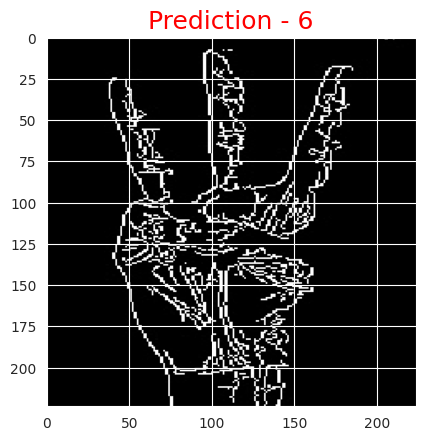

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


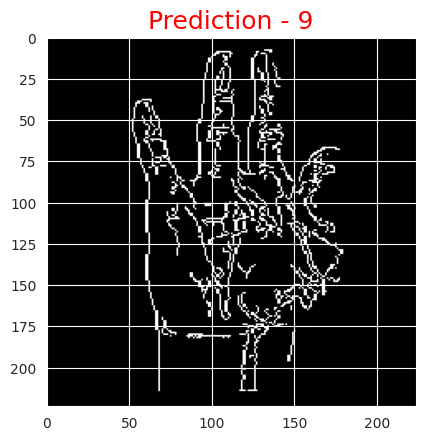

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


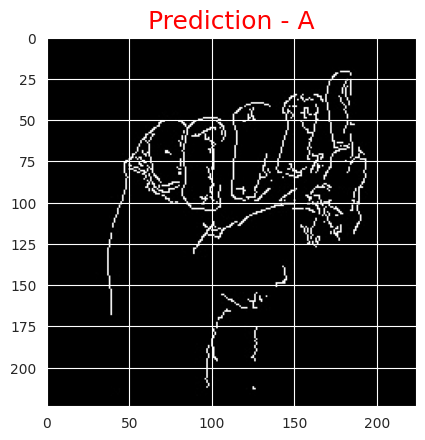

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


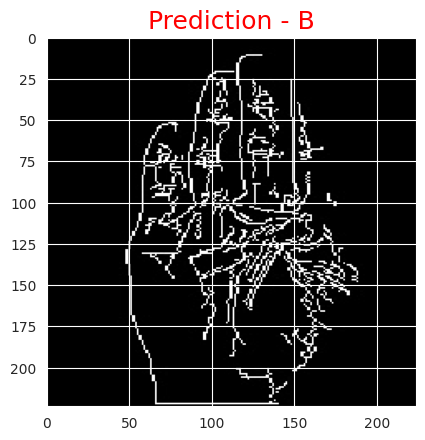

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


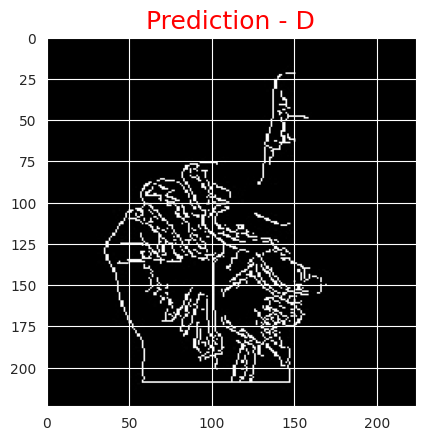

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 31ms/step


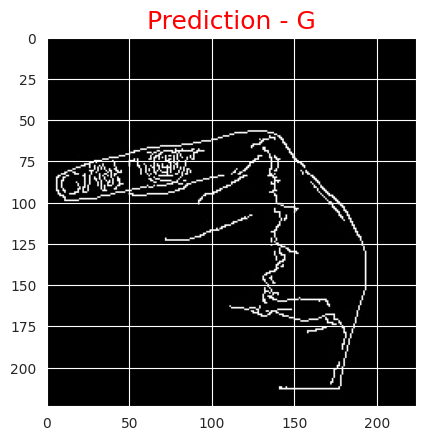

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 26ms/step


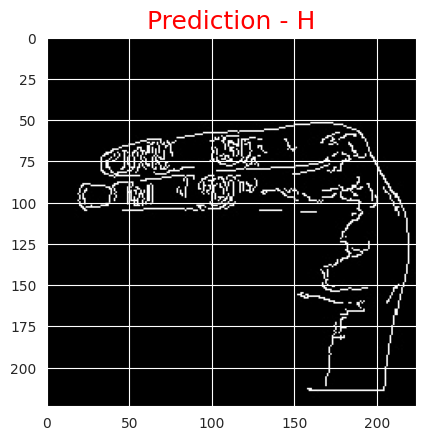

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


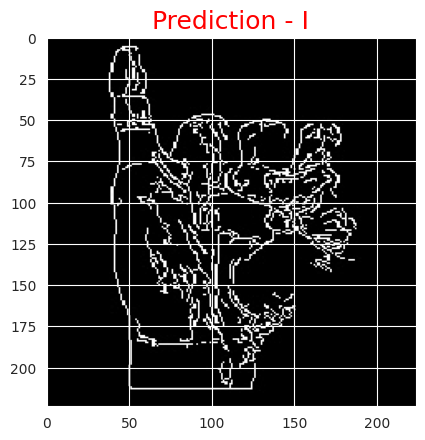

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


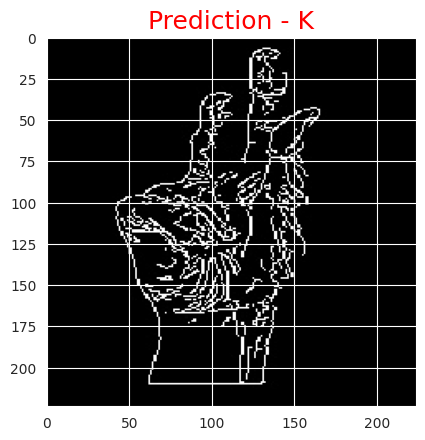

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


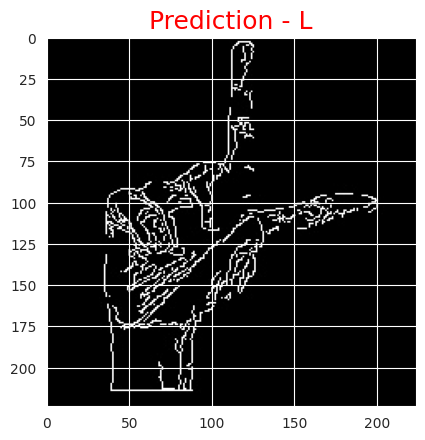

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 31ms/step


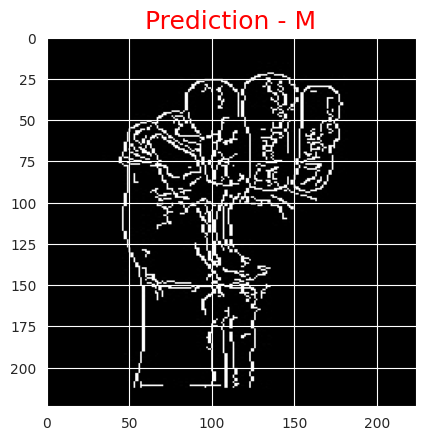

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


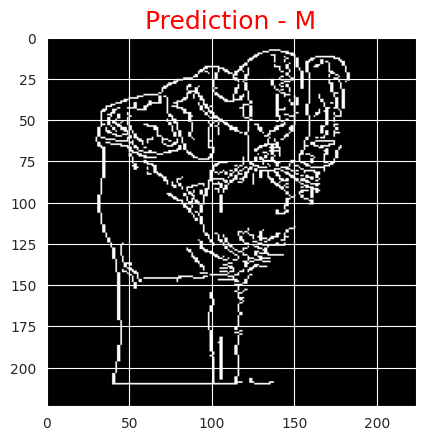

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


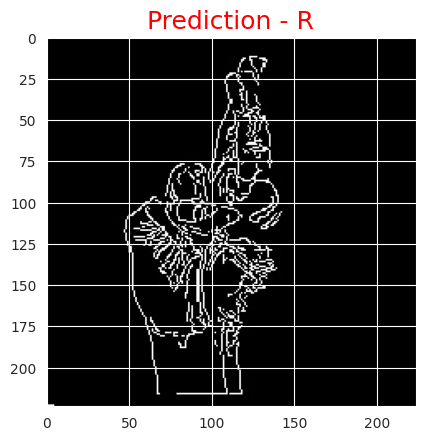

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 26ms/step


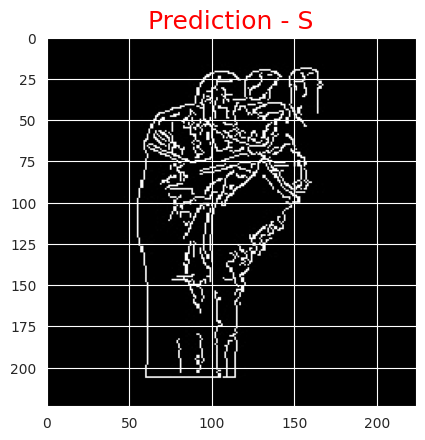

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


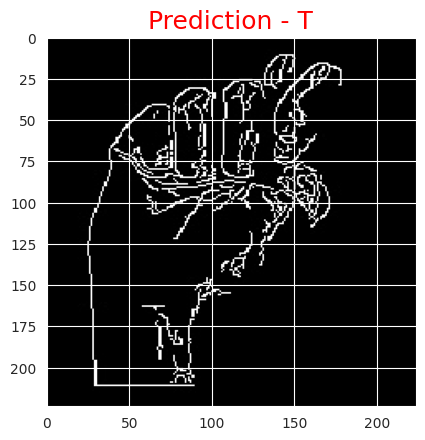

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


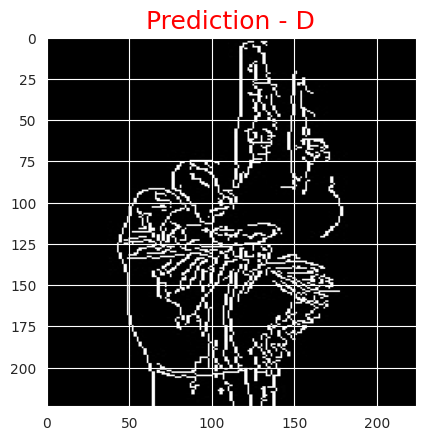

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


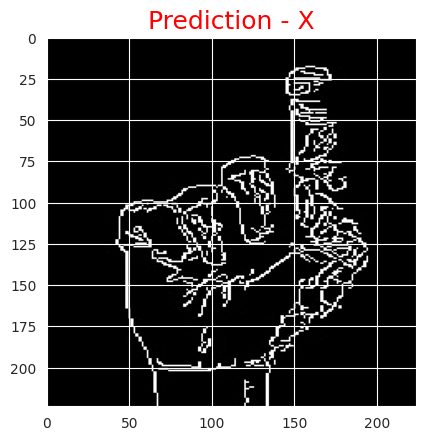

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


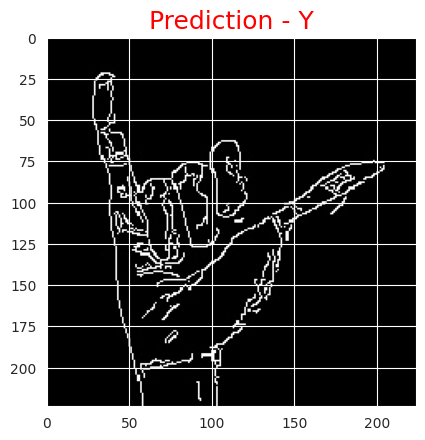

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_y_seg_1_cropped.jpeg', model)

# **InceptionV3**

In [ ]:
model = inception_model

1/1 [==============================] - 1s 1s/step


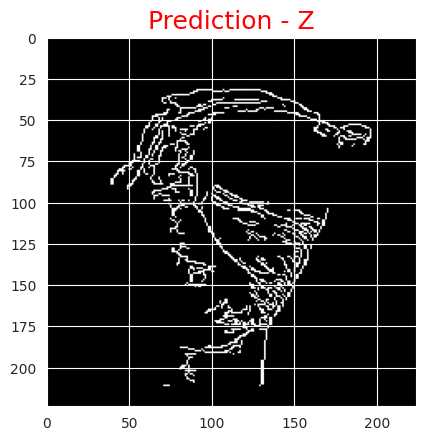

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 30ms/step


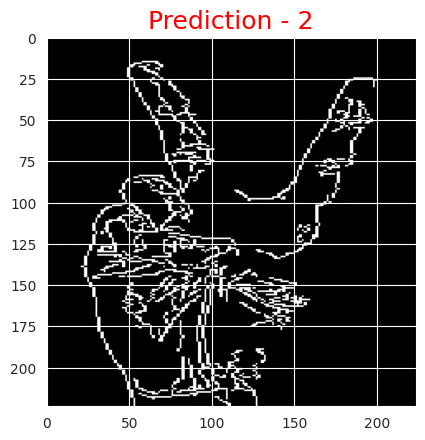

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


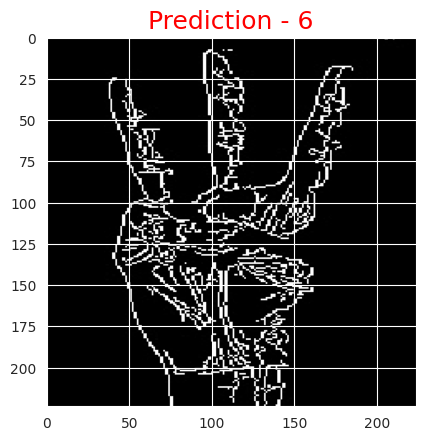

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


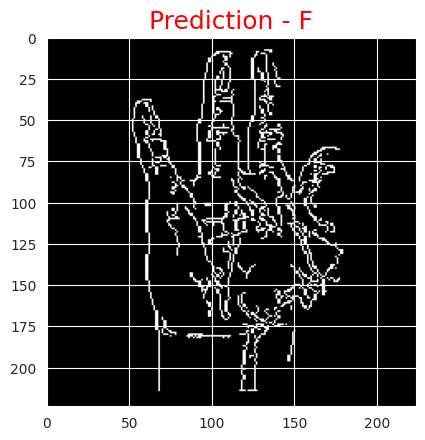

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 37ms/step


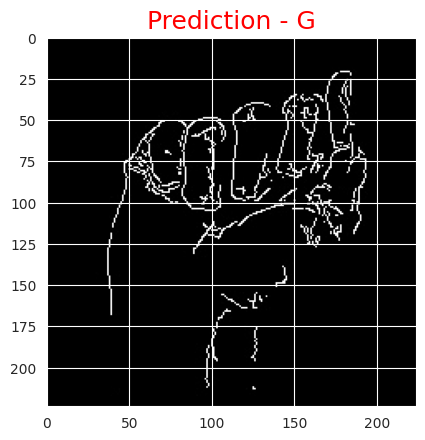

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 46ms/step


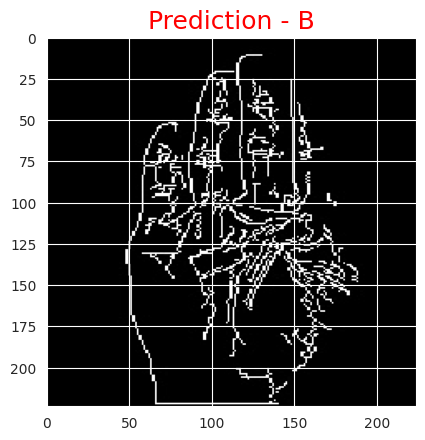

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 44ms/step


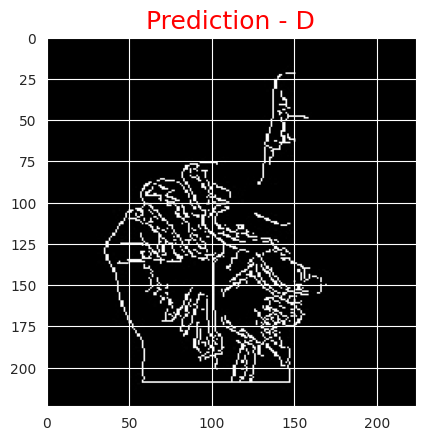

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 41ms/step


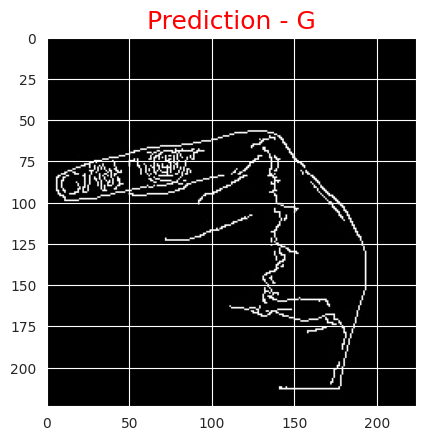

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 47ms/step


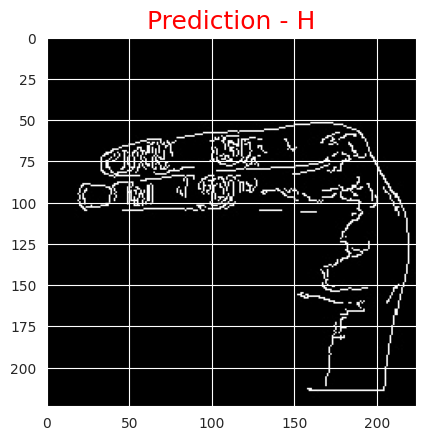

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 37ms/step


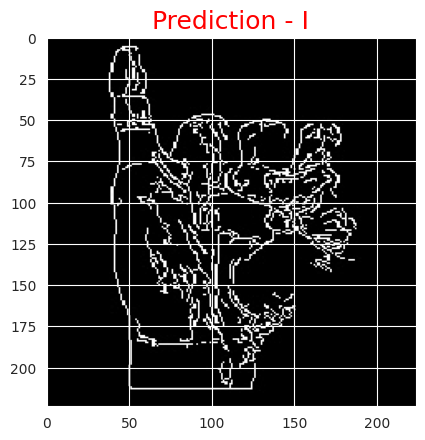

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 39ms/step


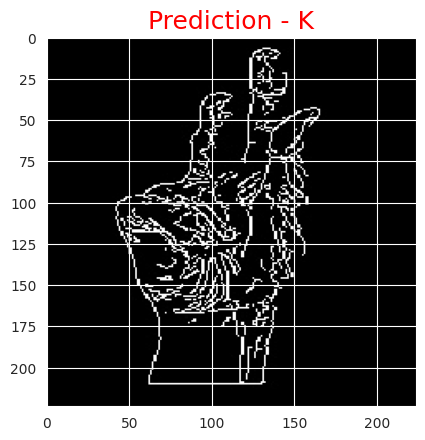

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 41ms/step


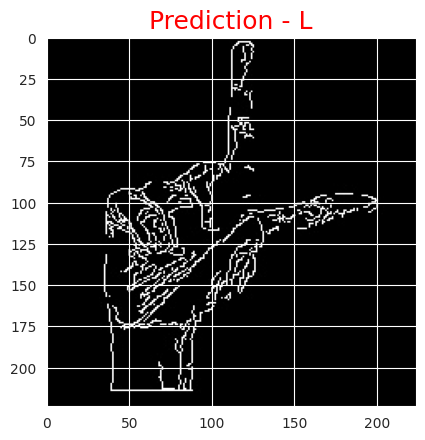

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 28ms/step


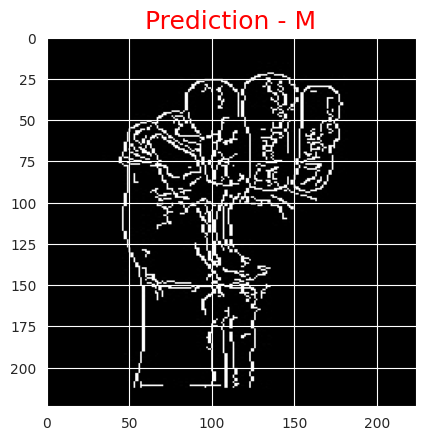

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


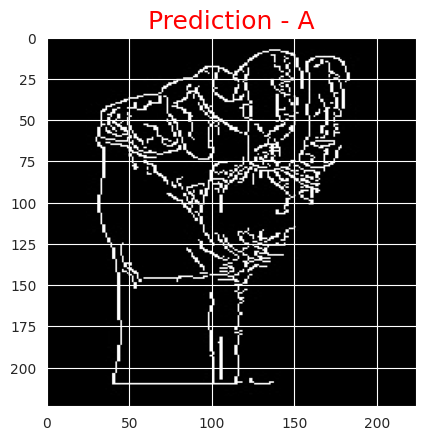

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


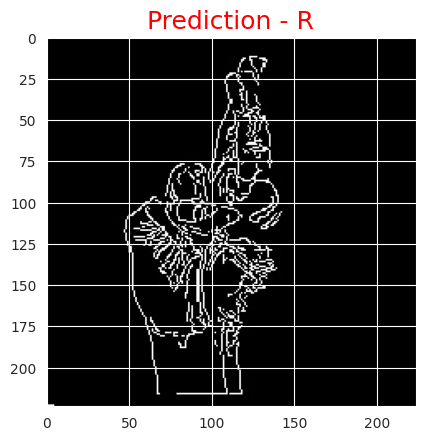

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


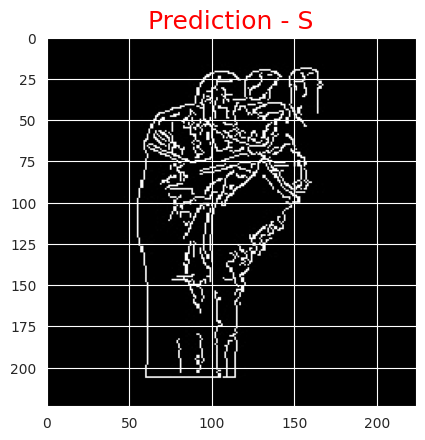

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


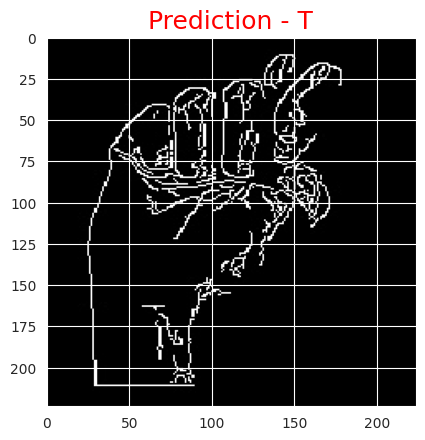

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


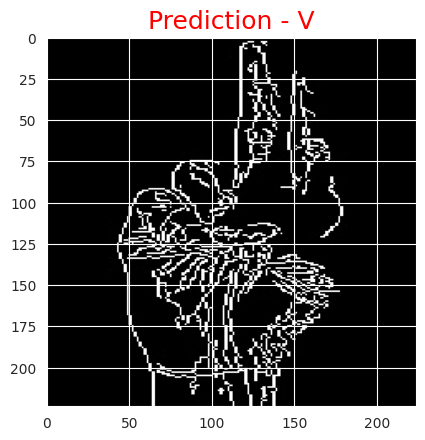

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 26ms/step


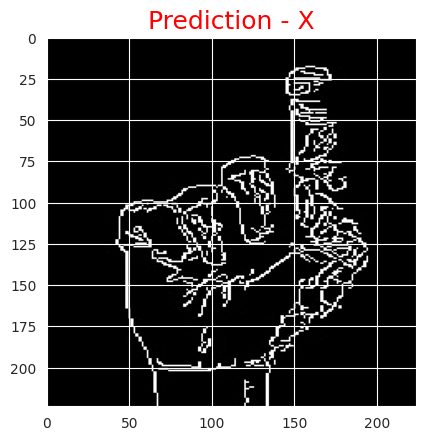

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


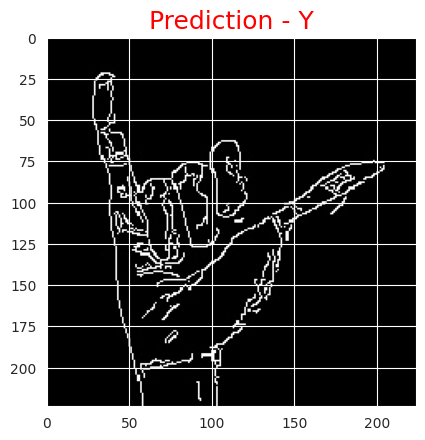

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_y_seg_1_cropped.jpeg', model)

# **Xception**

In [ ]:
model = xception_model

1/1 [==============================] - 1s 764ms/step


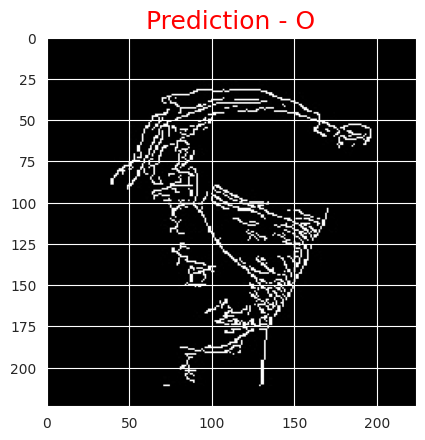

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


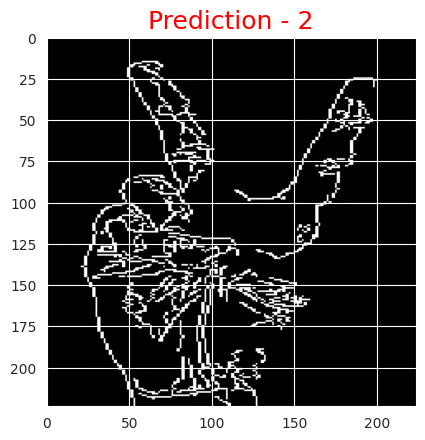

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


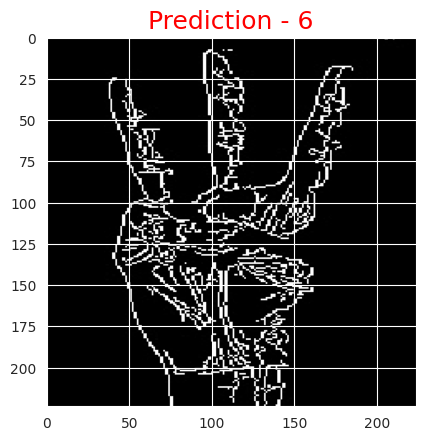

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


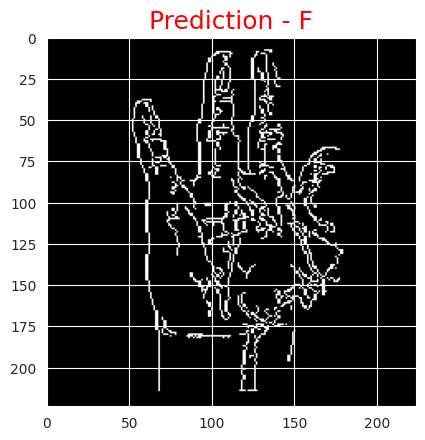

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


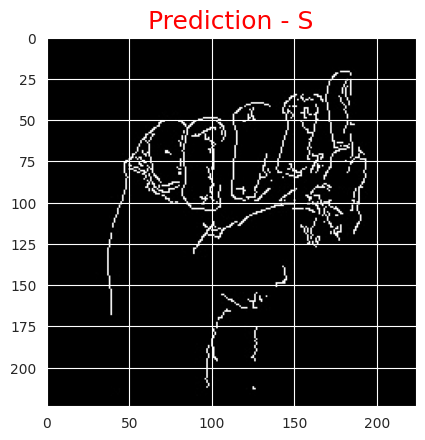

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


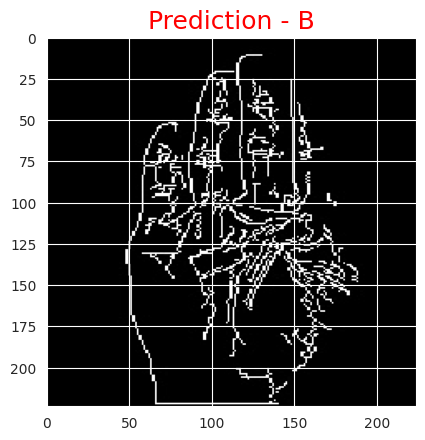

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


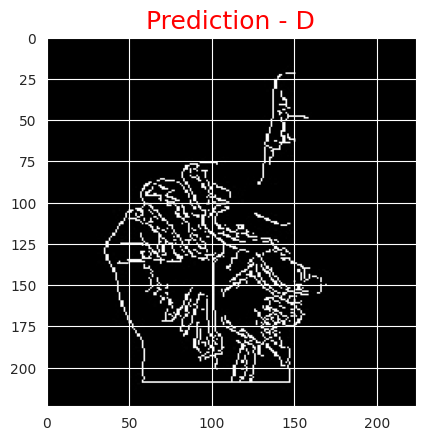

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


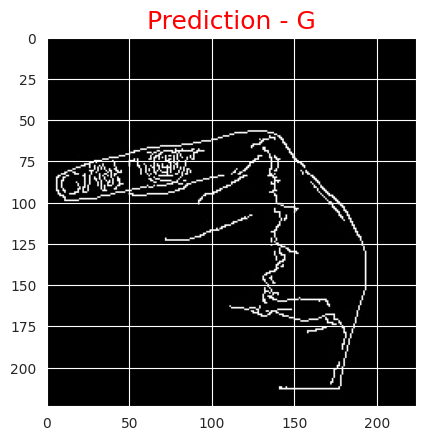

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


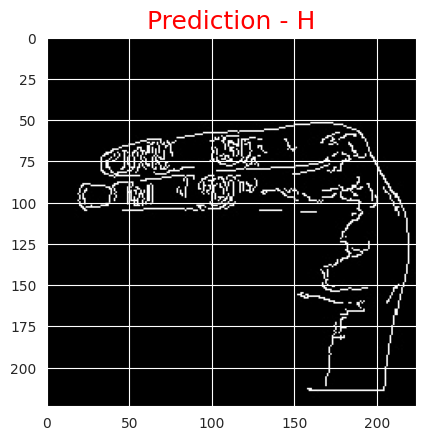

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


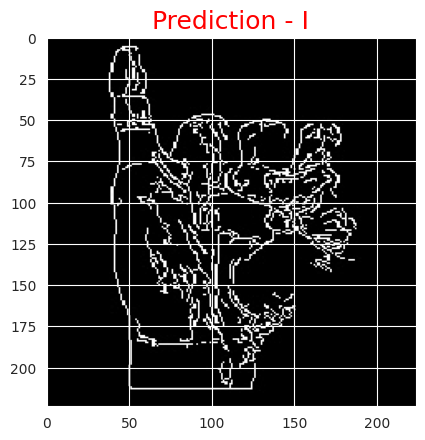

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


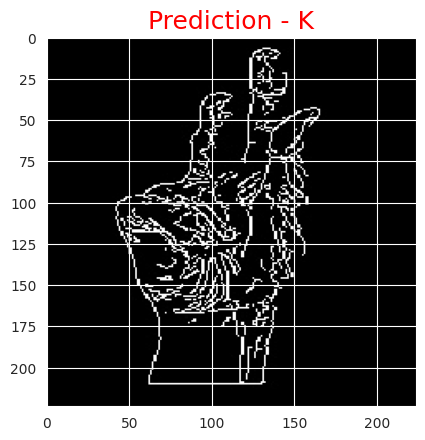

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


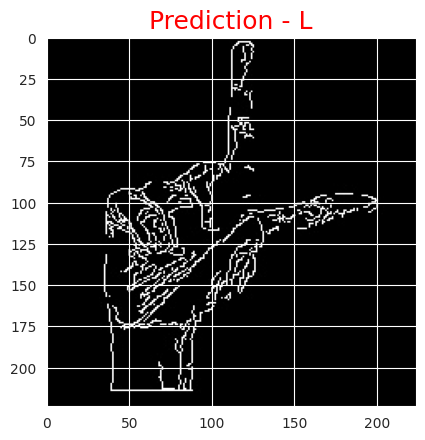

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


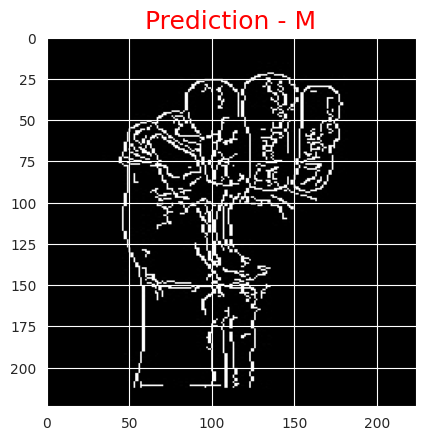

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 33ms/step


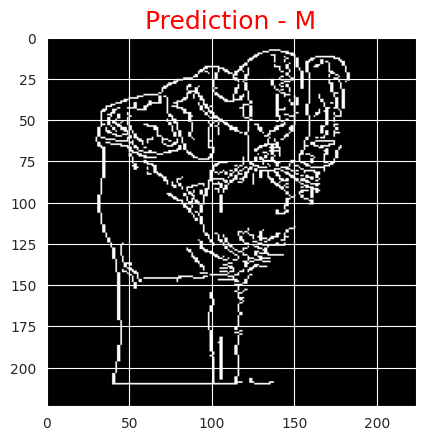

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


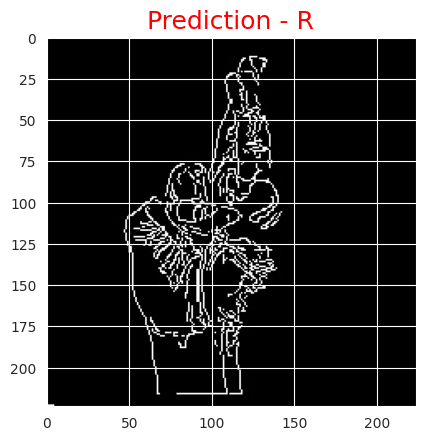

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 42ms/step


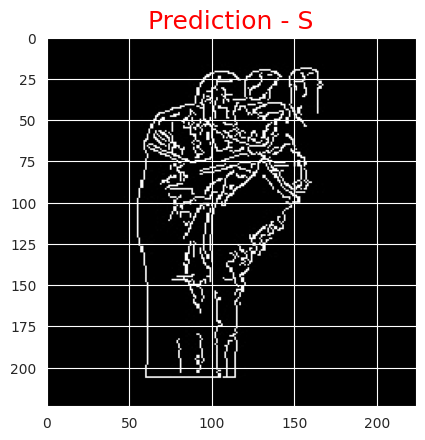

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 40ms/step


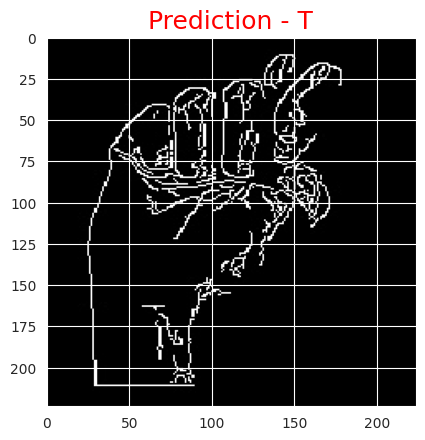

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 33ms/step


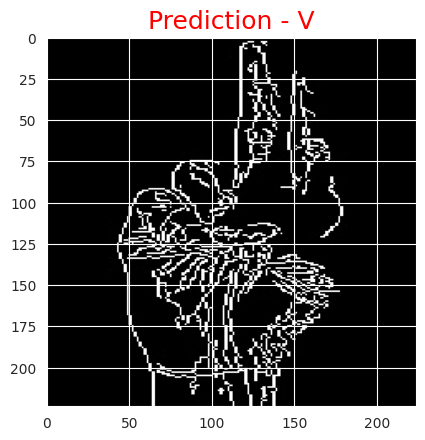

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


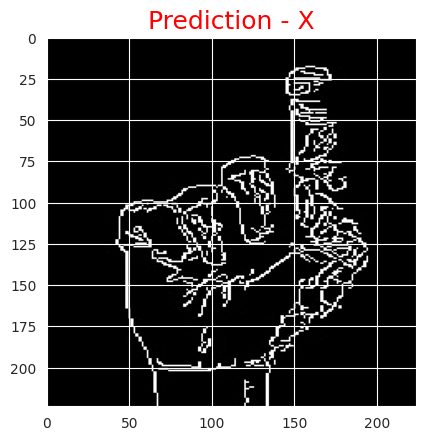

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 38ms/step


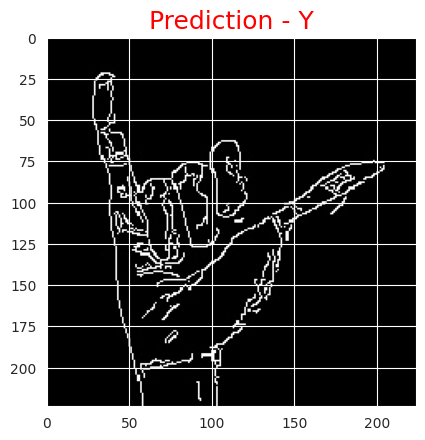

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_y_seg_1_cropped.jpeg', model)

# **VGG16**

In [ ]:
model = vgg16_model

1/1 [==============================] - 0s 161ms/step


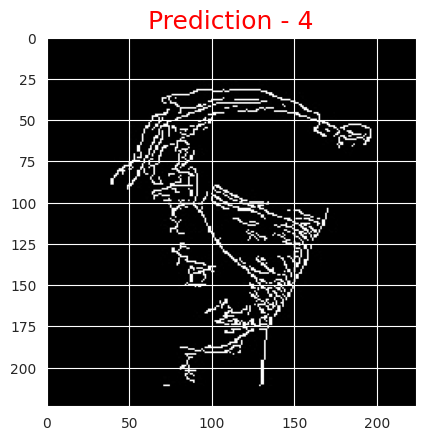

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


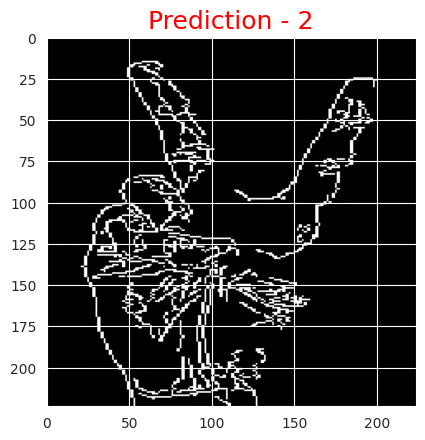

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


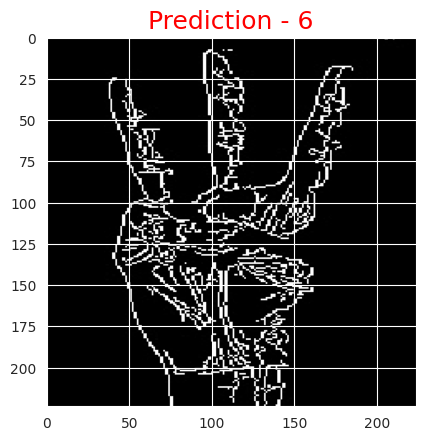

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 26ms/step


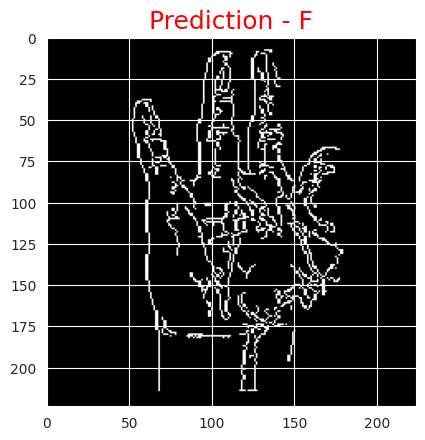

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


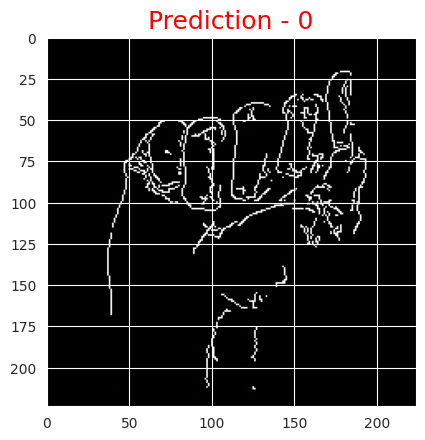

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


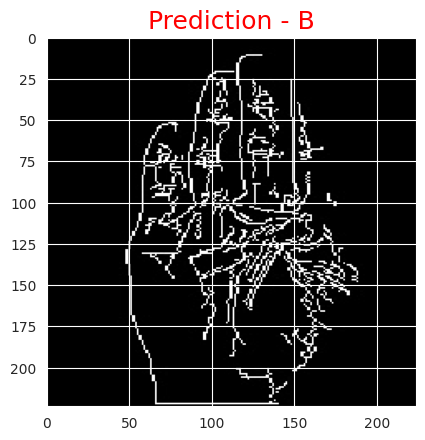

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


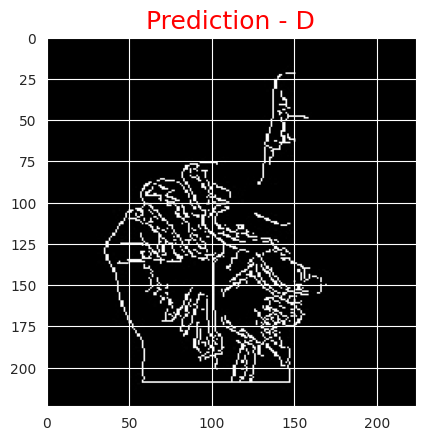

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 18ms/step


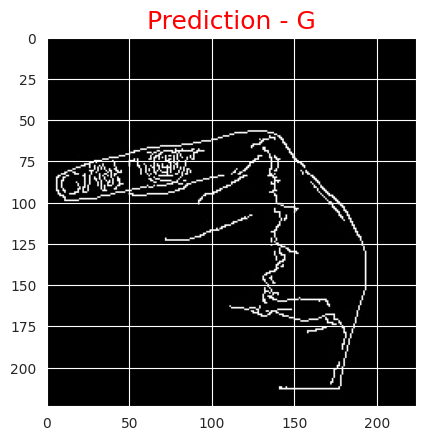

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


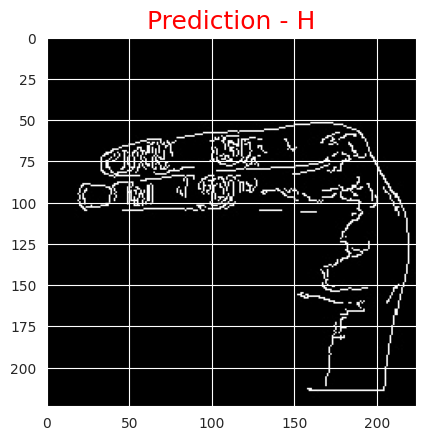

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


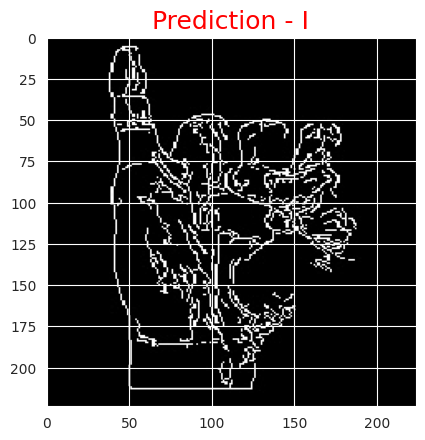

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


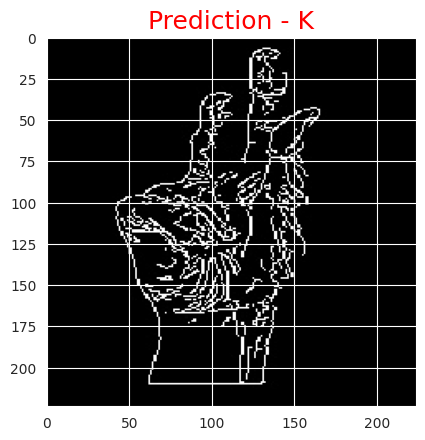

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


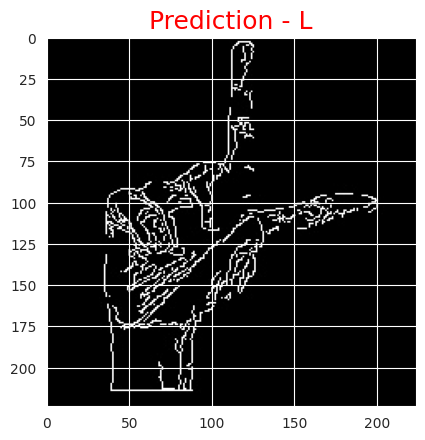

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 18ms/step


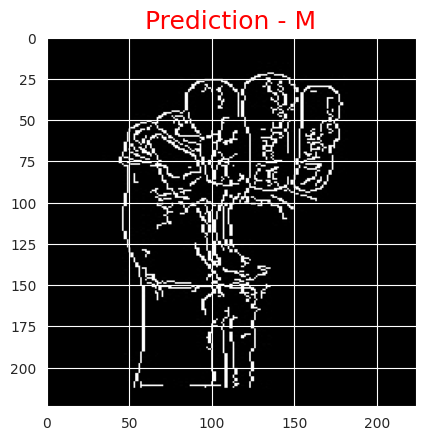

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


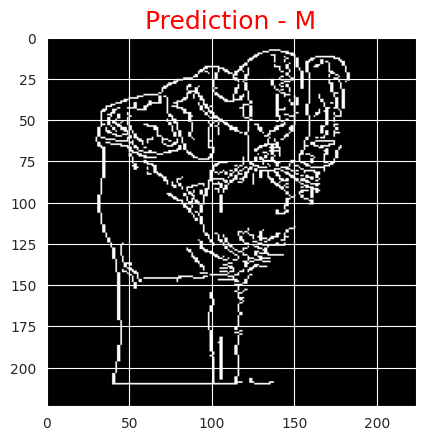

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 18ms/step


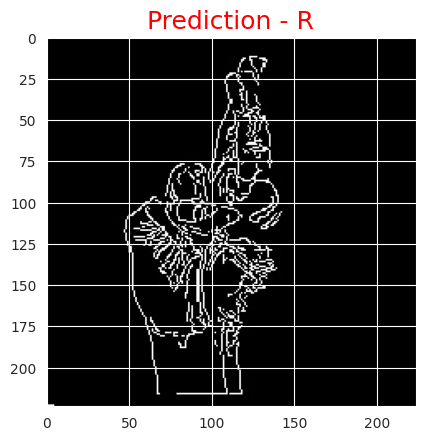

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 18ms/step


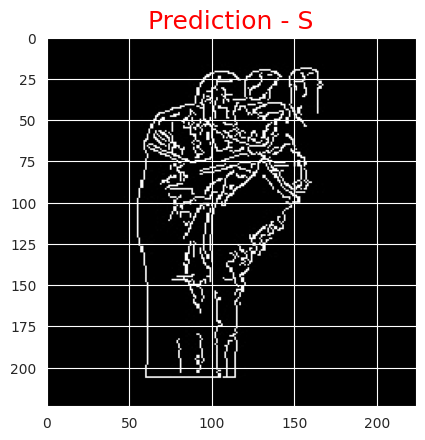

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


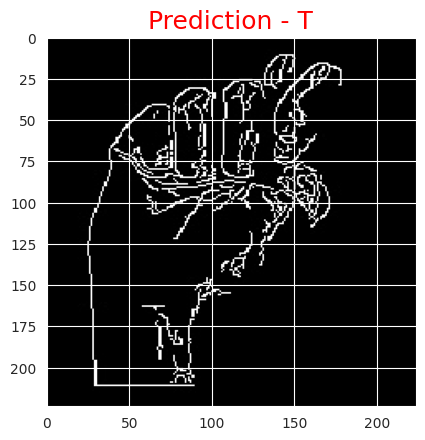

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 18ms/step


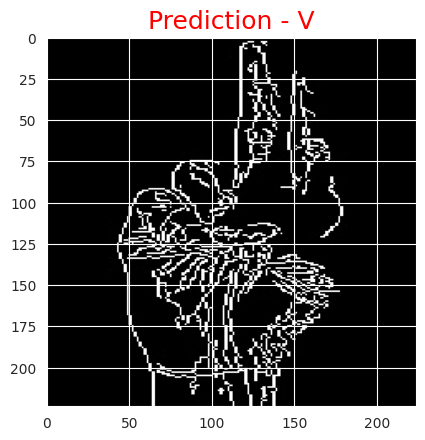

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


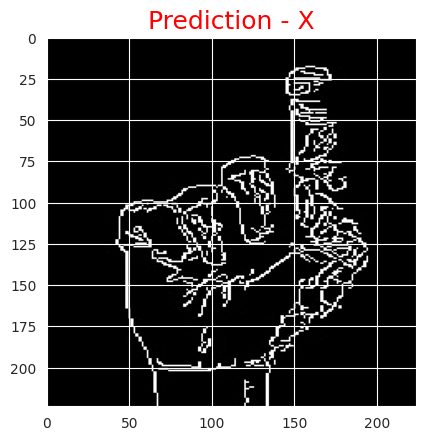

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 18ms/step


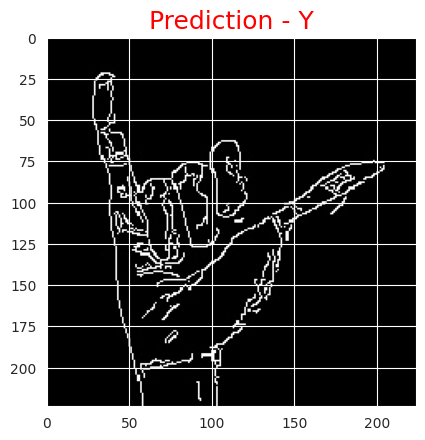

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_y_seg_1_cropped.jpeg', model)

# **VGG19**

In [ ]:
model = vgg19_model

1/1 [==============================] - 0s 164ms/step


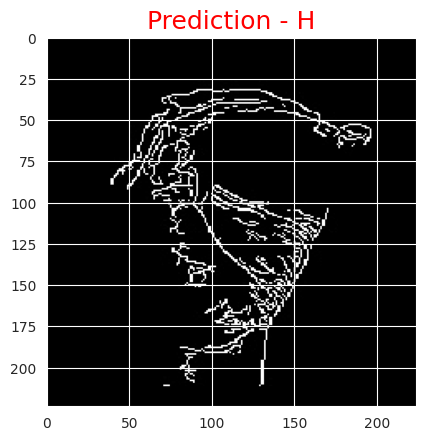

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 30ms/step


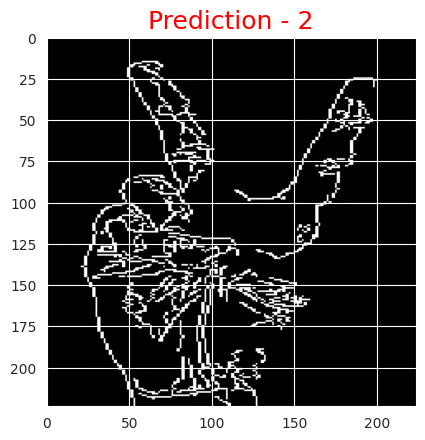

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


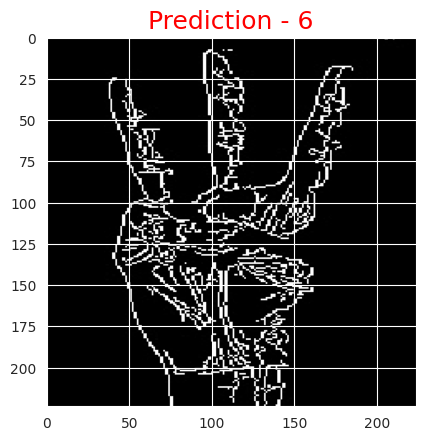

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 29ms/step


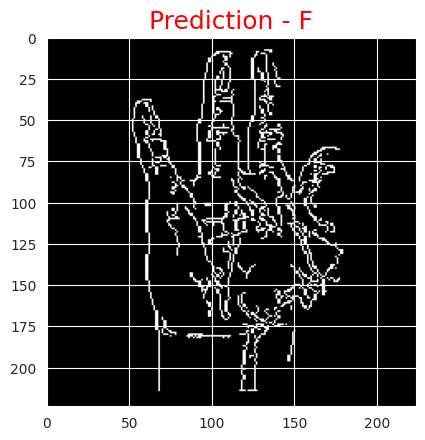

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 27ms/step


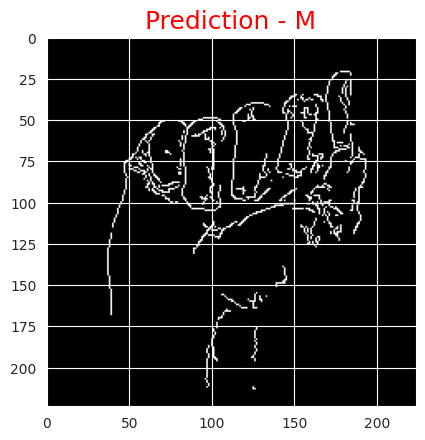

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 30ms/step


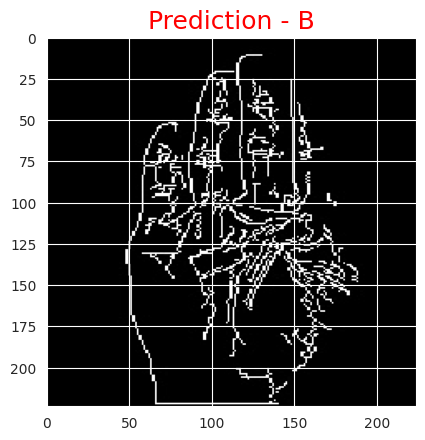

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 29ms/step


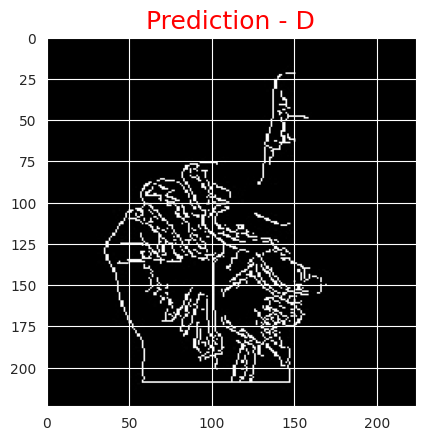

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 33ms/step


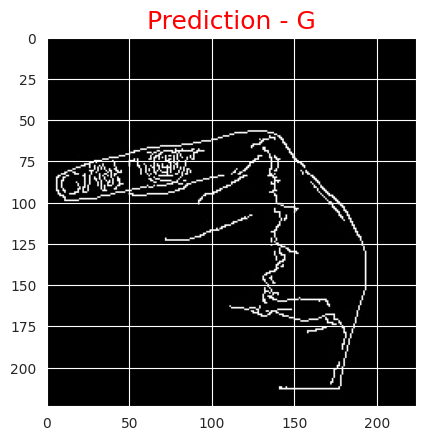

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 26ms/step


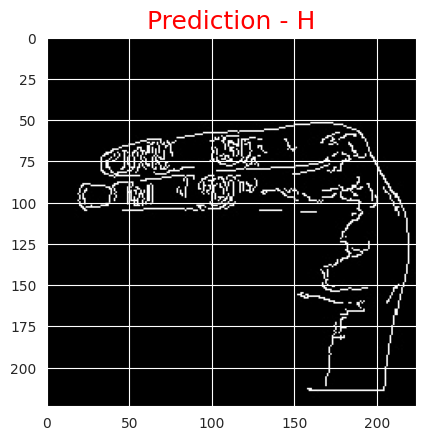

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 31ms/step


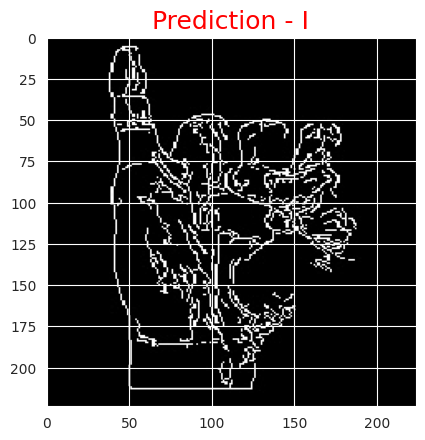

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 18ms/step


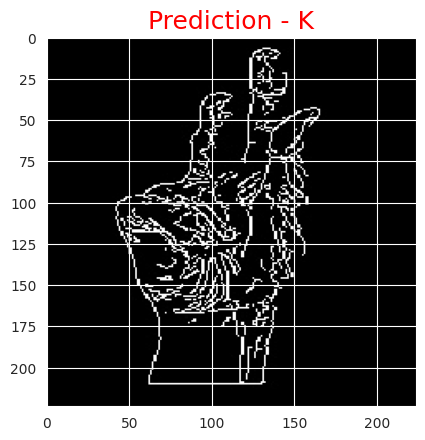

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 18ms/step


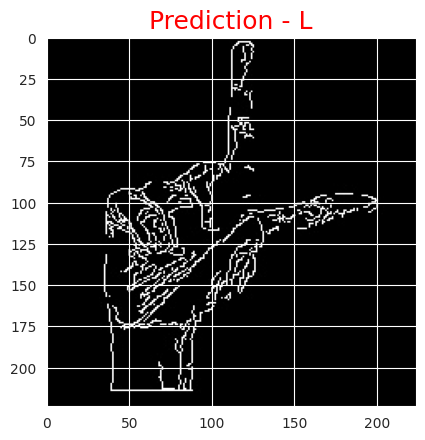

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


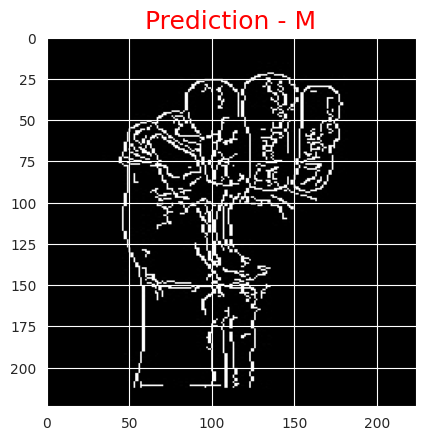

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


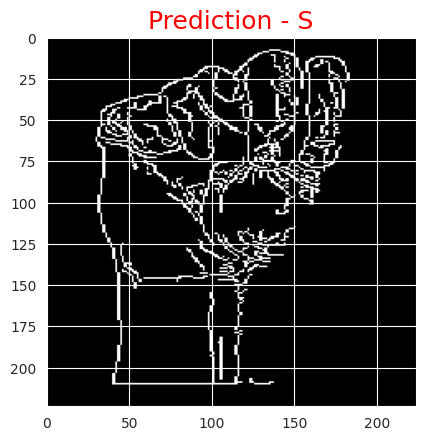

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 29ms/step


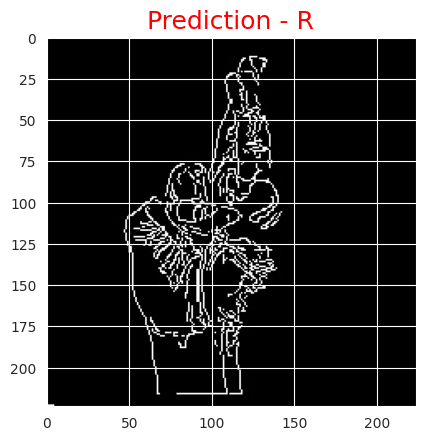

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 18ms/step


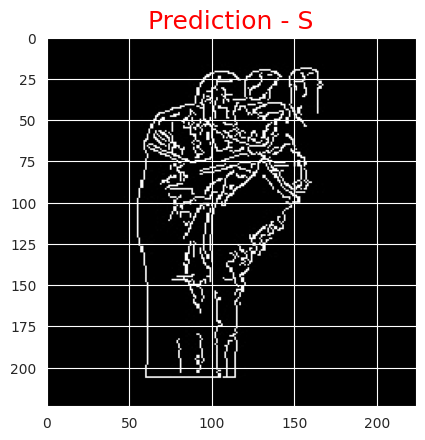

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


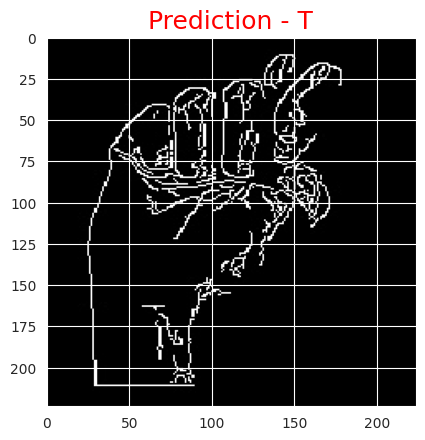

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


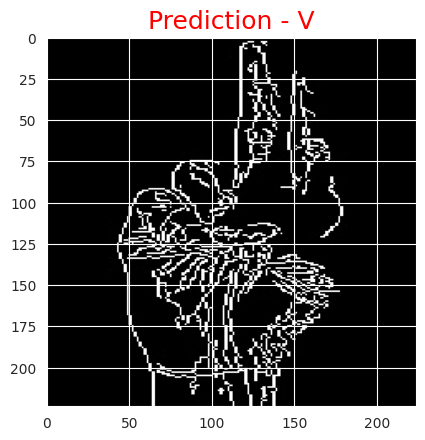

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 19ms/step


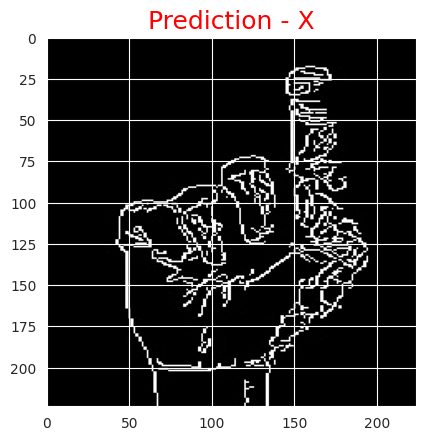

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


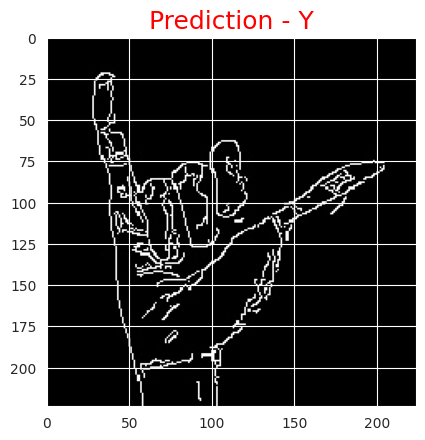

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_y_seg_1_cropped.jpeg', model)

# **ResNet50**

In [ ]:
model = model_50

1/1 [==============================] - 1s 909ms/step


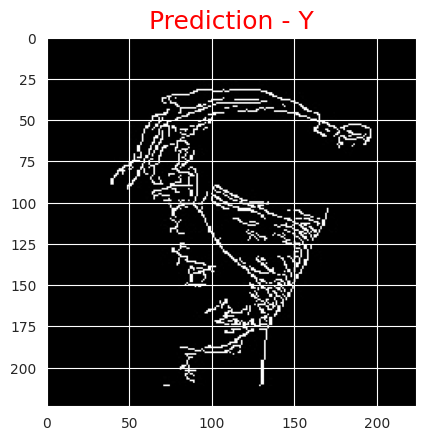

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


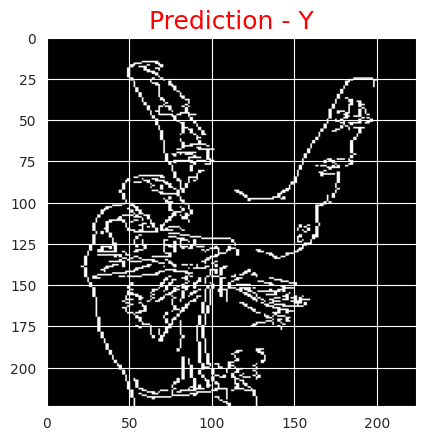

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


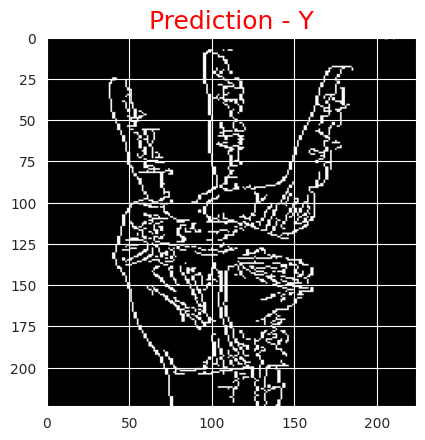

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


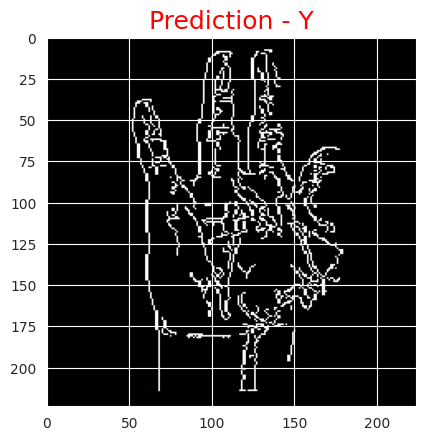

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


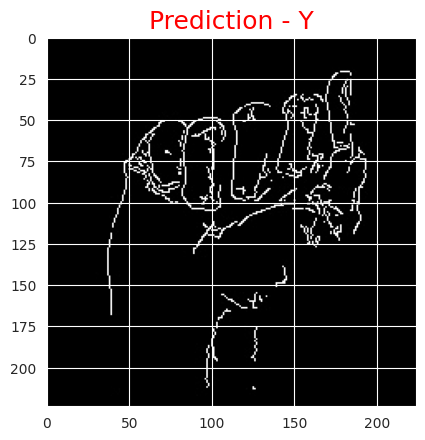

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


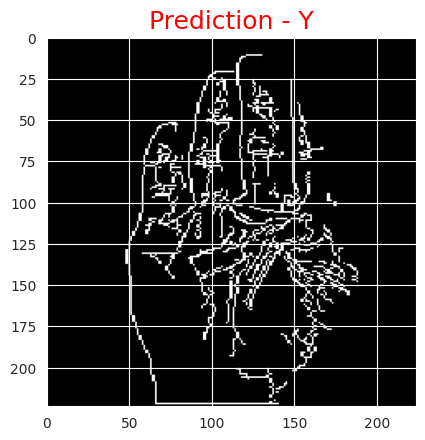

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


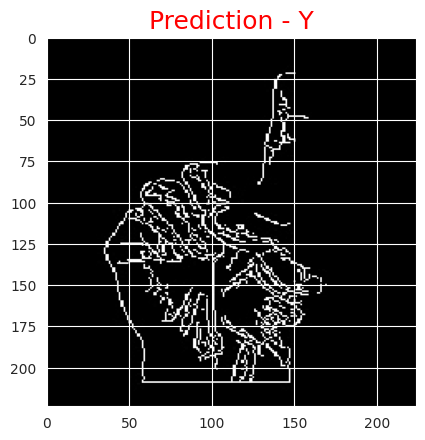

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


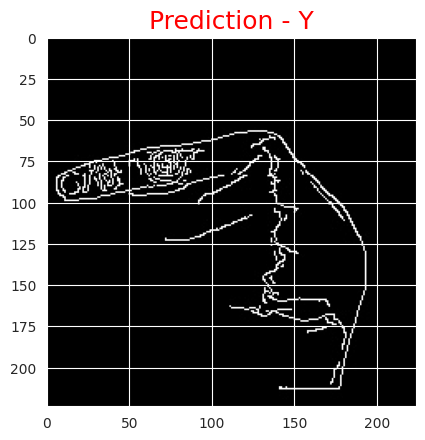

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


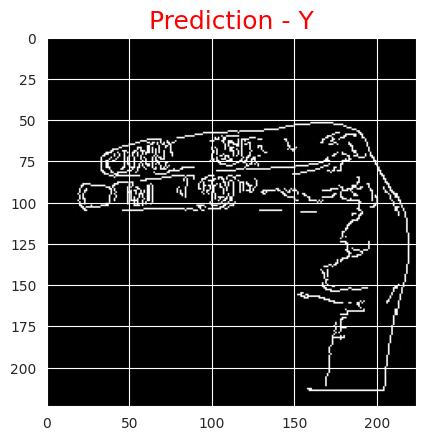

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 40ms/step


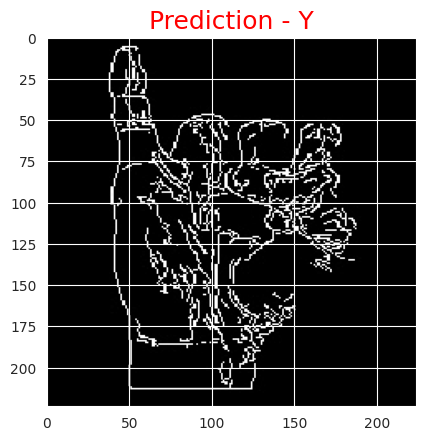

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


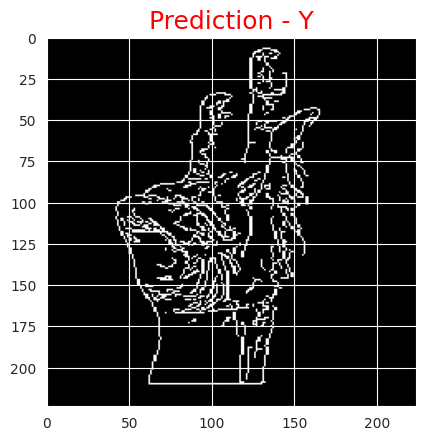

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 37ms/step


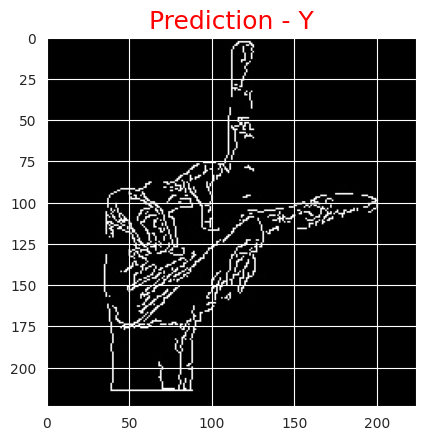

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


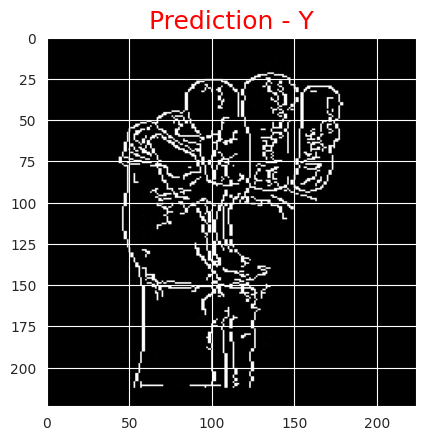

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 42ms/step


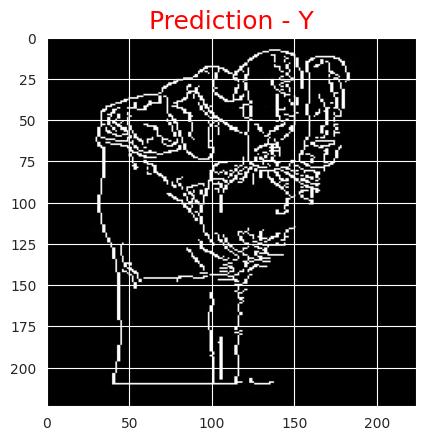

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 31ms/step


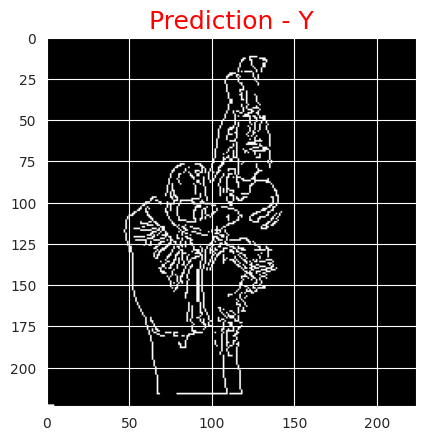

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


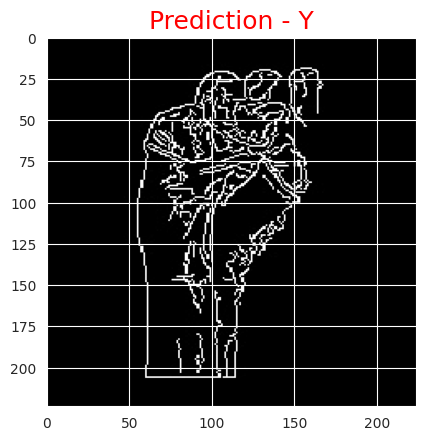

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 38ms/step


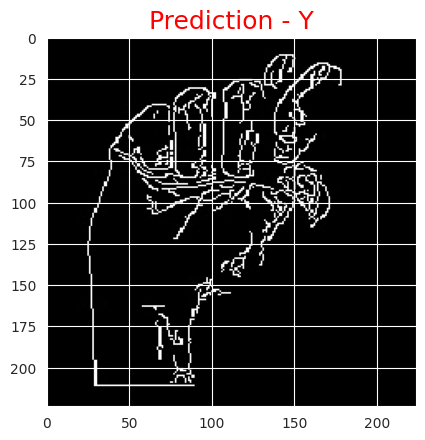

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 34ms/step


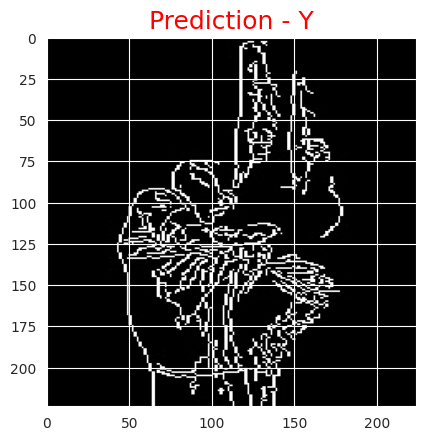

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


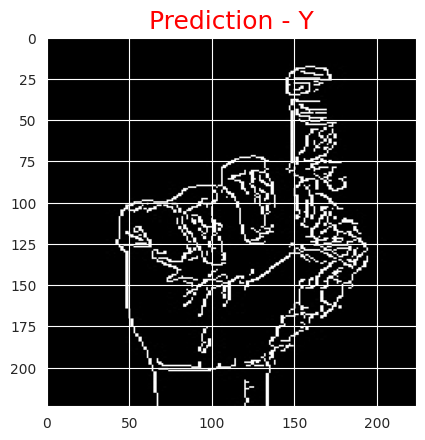

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


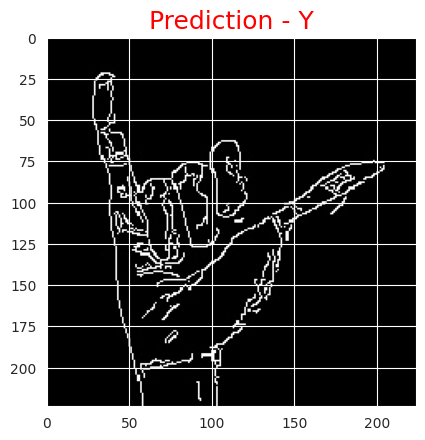

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_y_seg_1_cropped.jpeg', model)

# **ResNet50v2**

In [ ]:
model = model_50v2

1/1 [==============================] - 1s 875ms/step


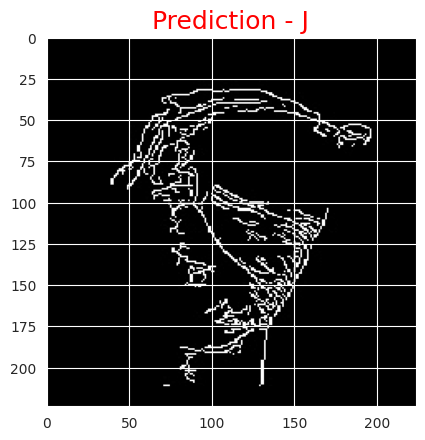

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 30ms/step


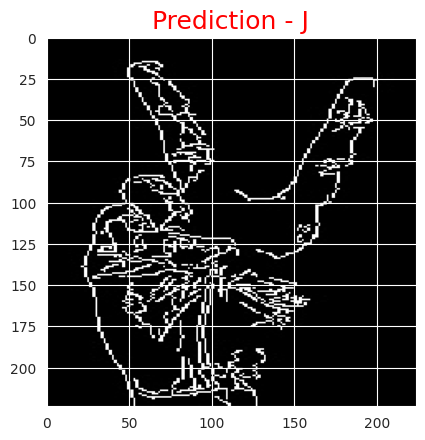

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


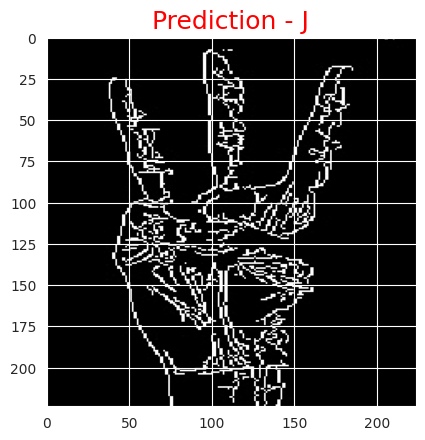

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 26ms/step


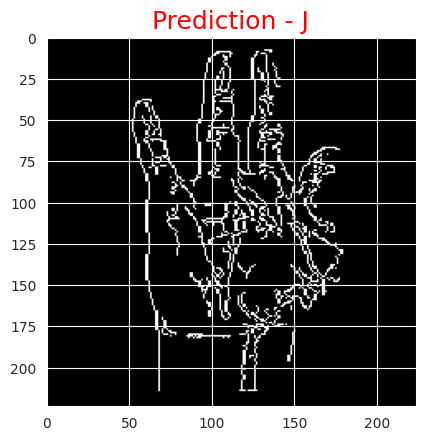

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


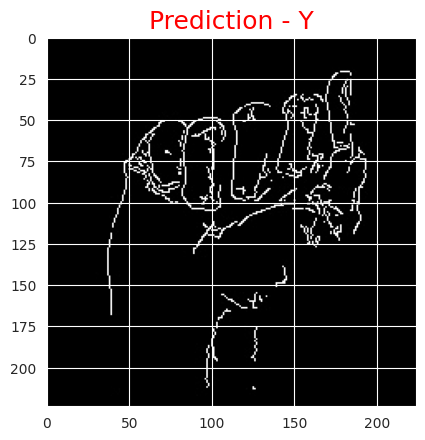

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


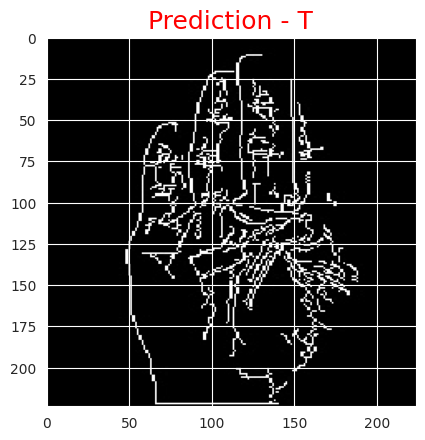

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


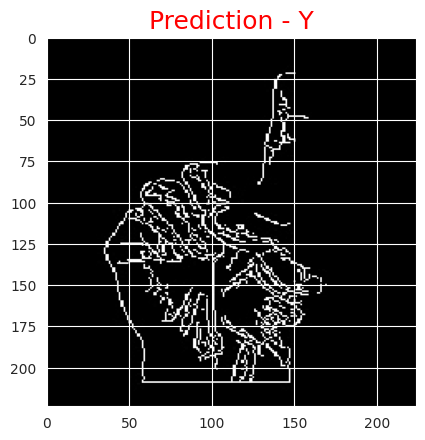

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


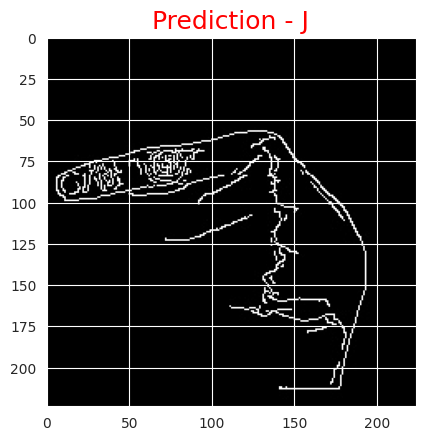

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


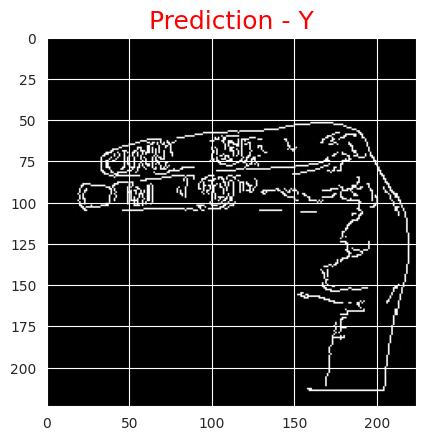

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


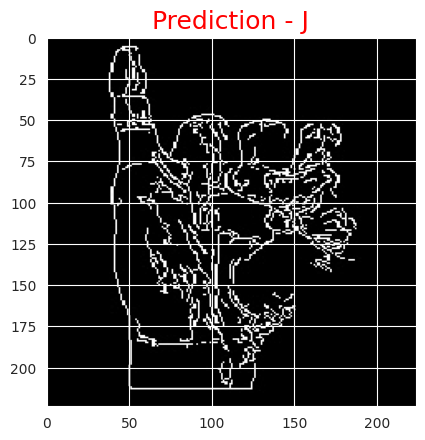

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


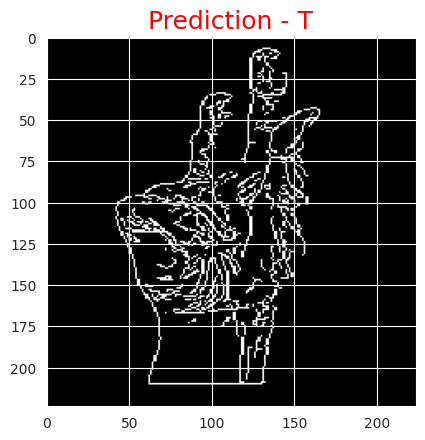

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


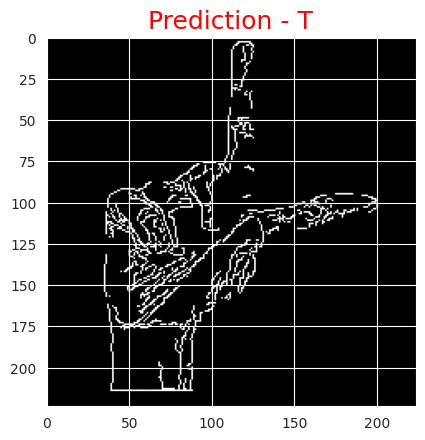

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


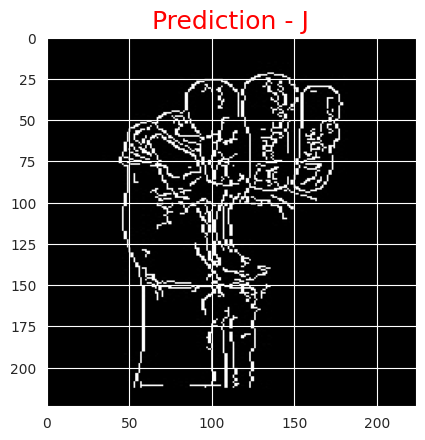

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


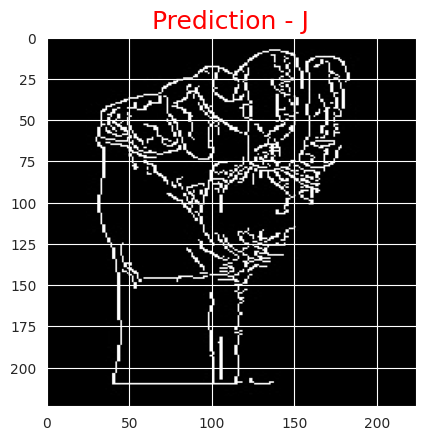

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


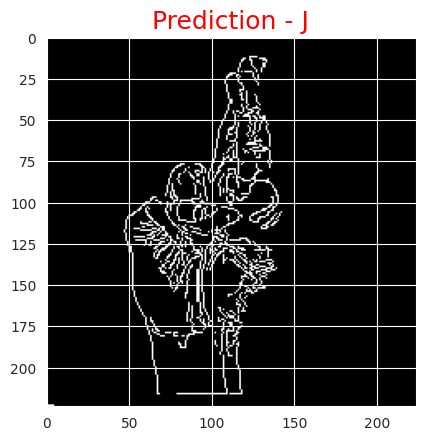

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


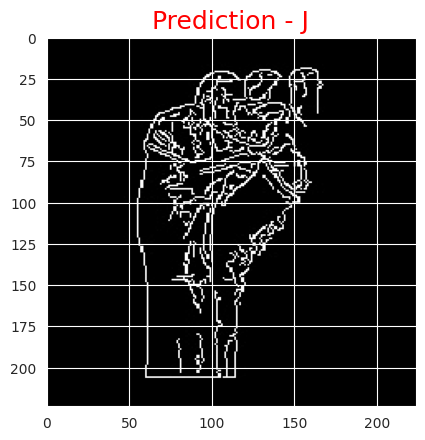

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


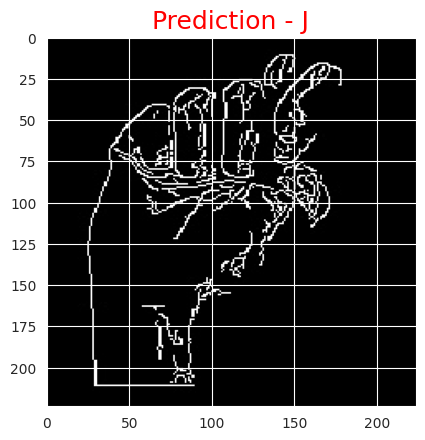

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


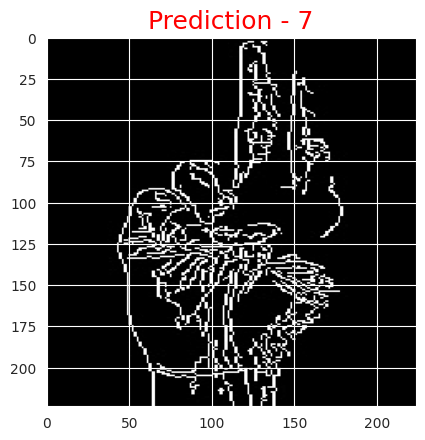

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 31ms/step


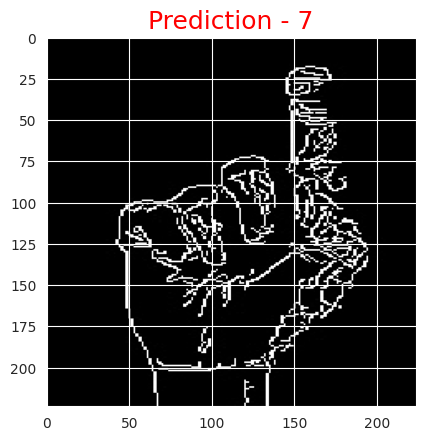

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 33ms/step


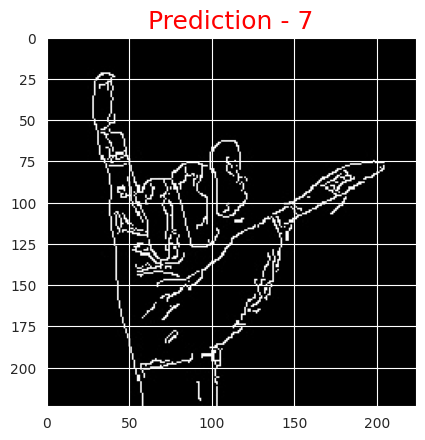

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_y_seg_1_cropped.jpeg', model)

# **InceptionResNet50v2**

In [ ]:
model = model_irv2

1/1 [==============================] - 1s 1s/step


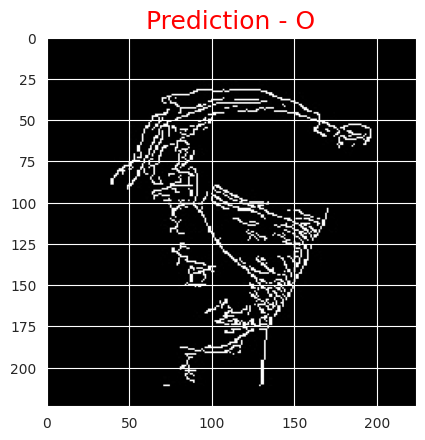

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 39ms/step


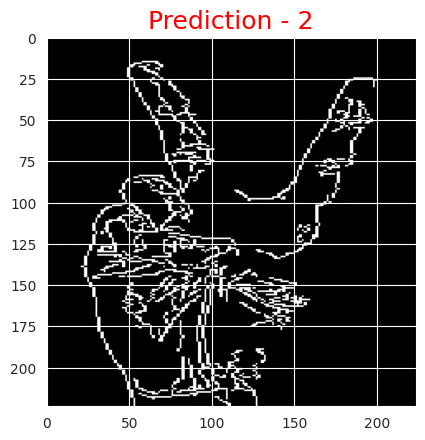

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


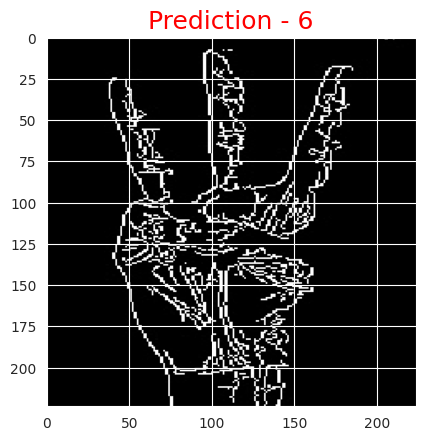

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


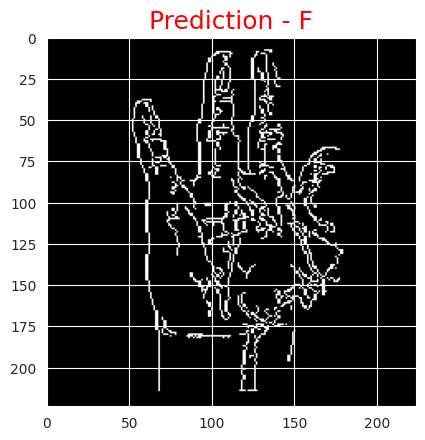

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


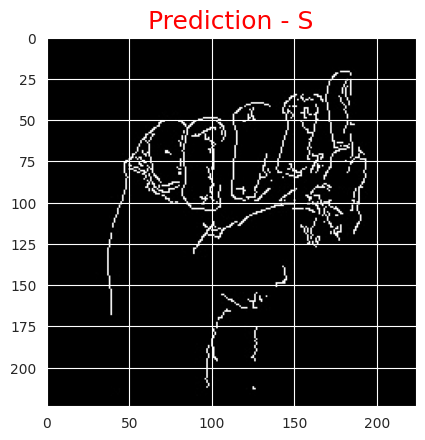

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


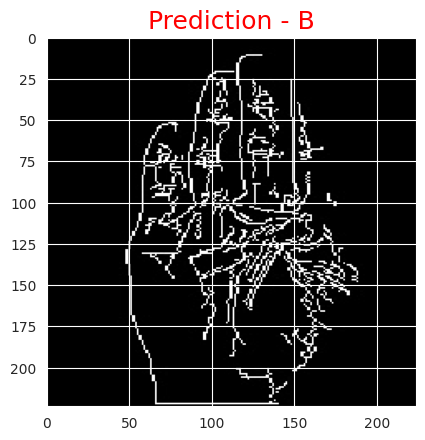

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


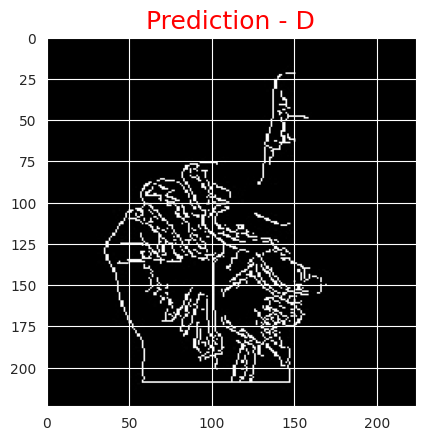

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


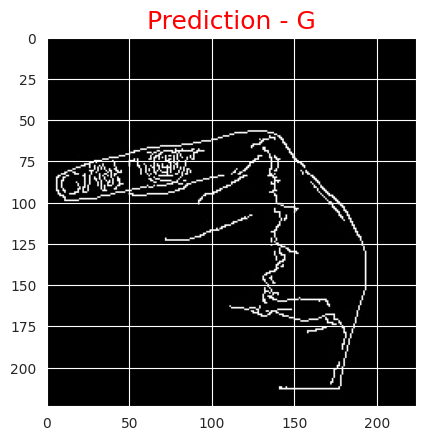

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


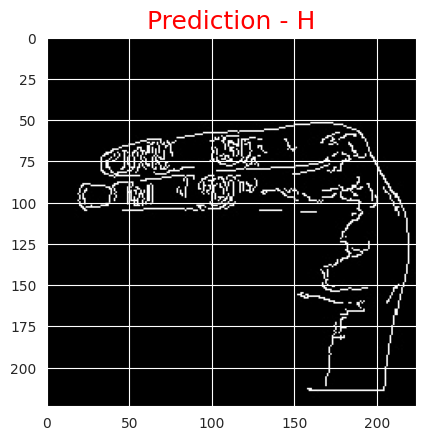

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


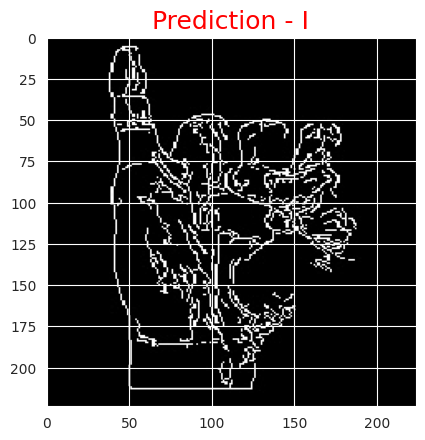

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


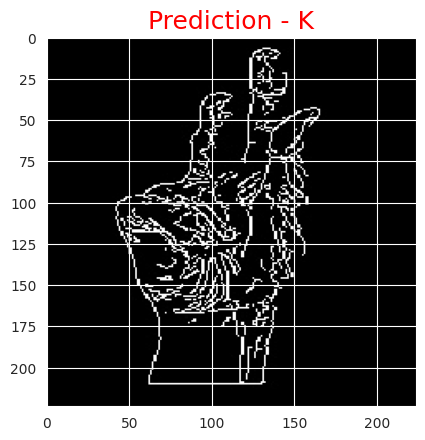

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


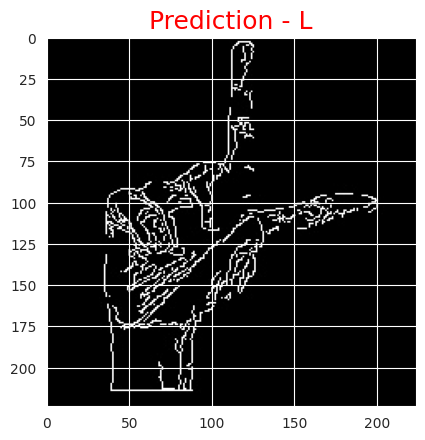

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


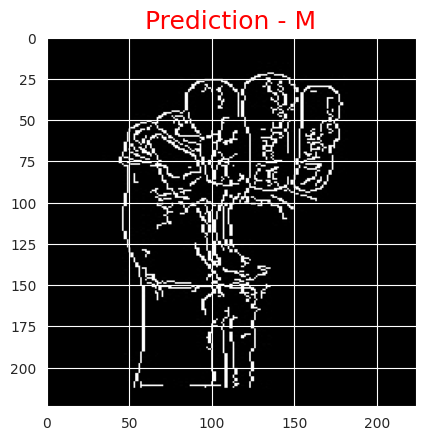

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


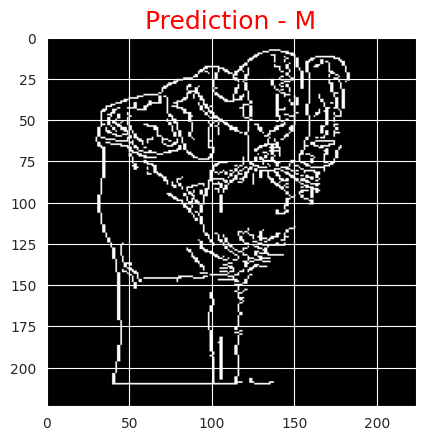

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


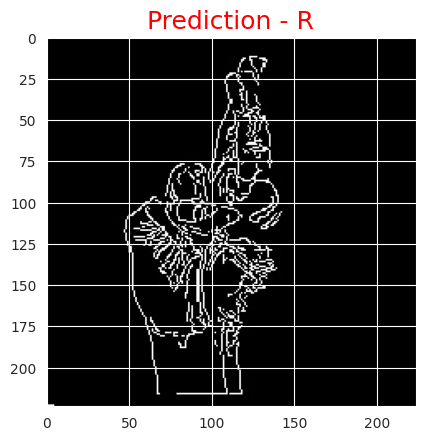

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


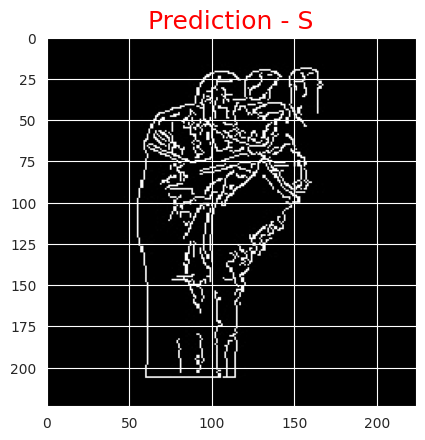

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


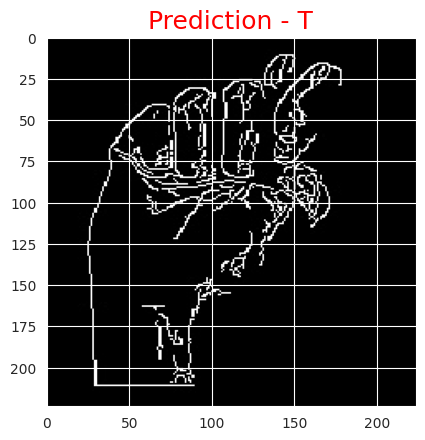

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


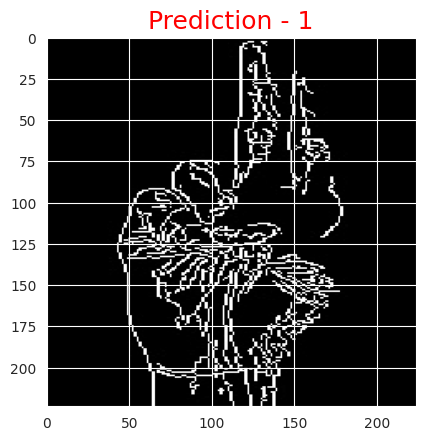

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


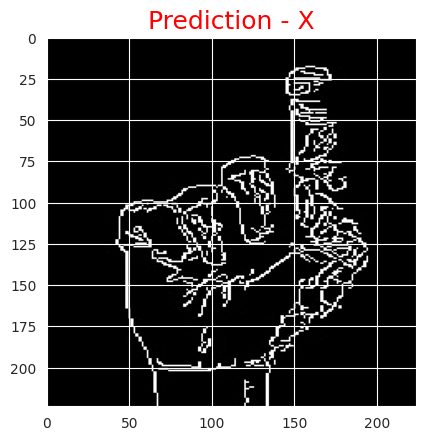

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


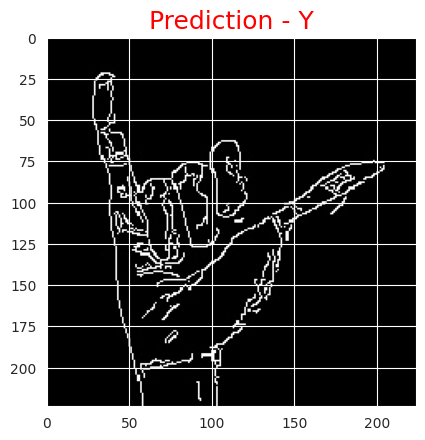

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_y_seg_1_cropped.jpeg', model)

# **MobileNet**

In [ ]:
model = model_mnet

1/1 [==============================] - 0s 488ms/step


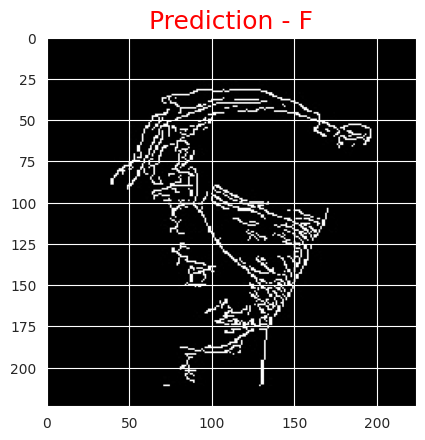

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


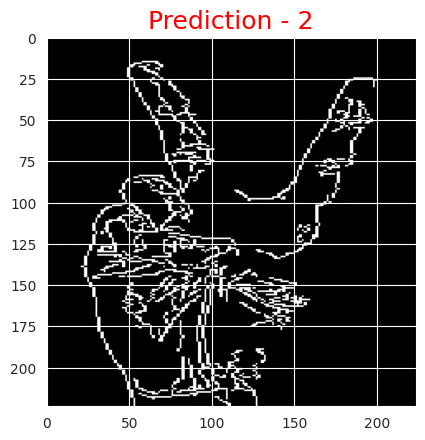

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


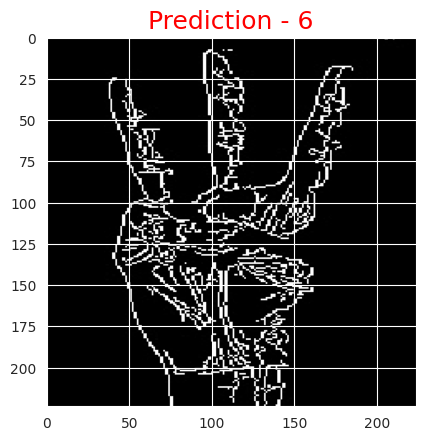

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 29ms/step


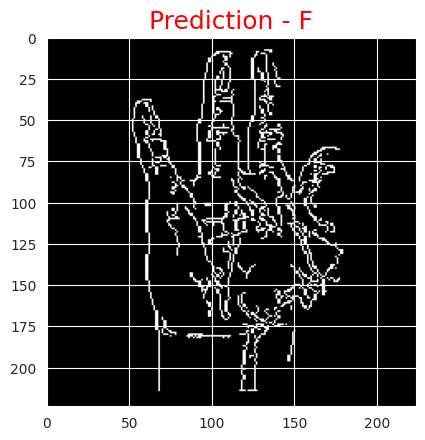

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 30ms/step


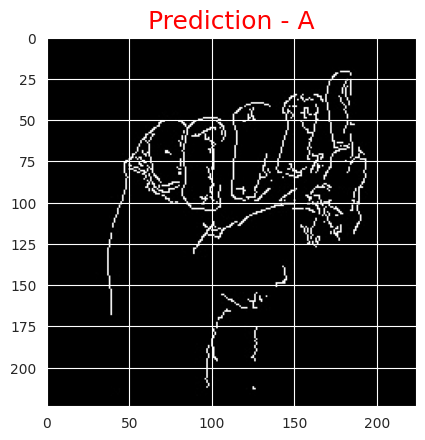

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 30ms/step


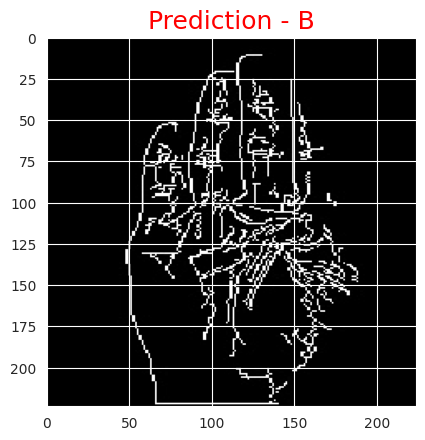

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 33ms/step


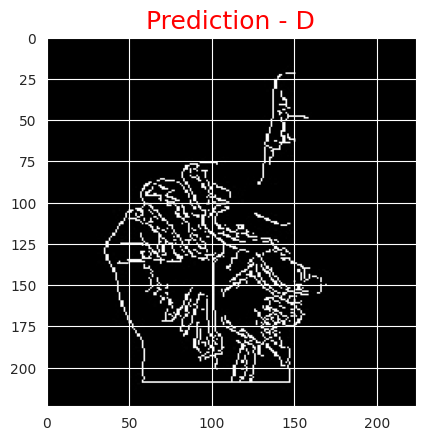

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


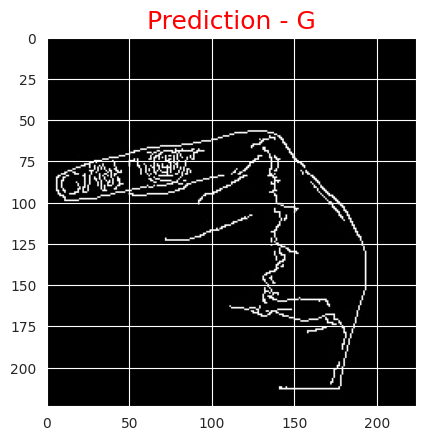

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 31ms/step


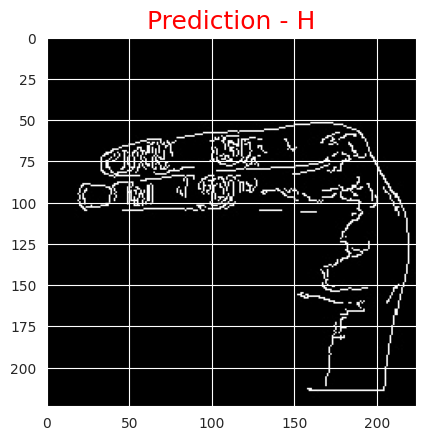

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 31ms/step


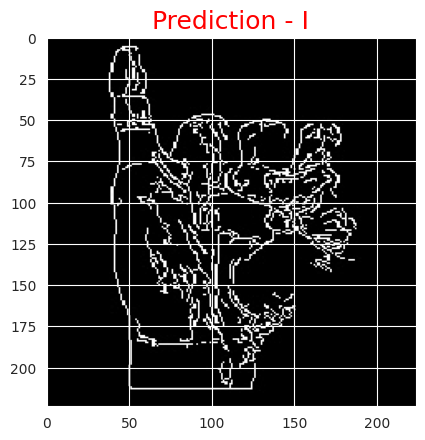

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 43ms/step


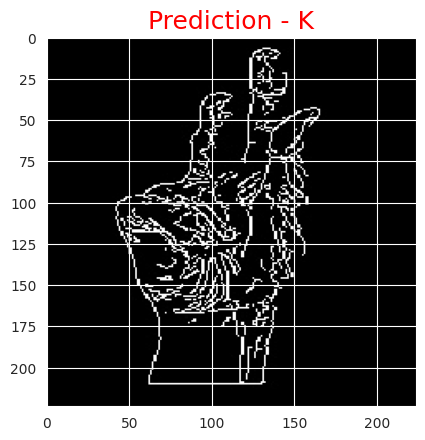

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


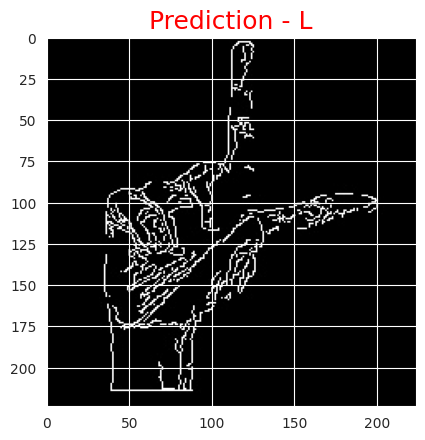

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


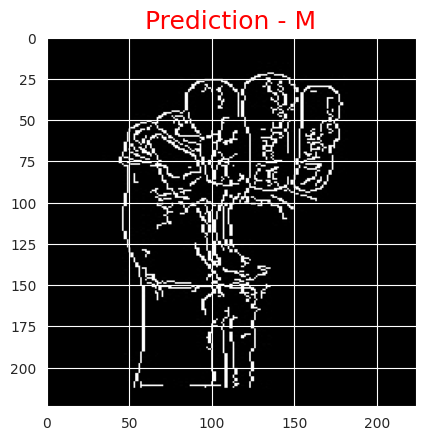

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


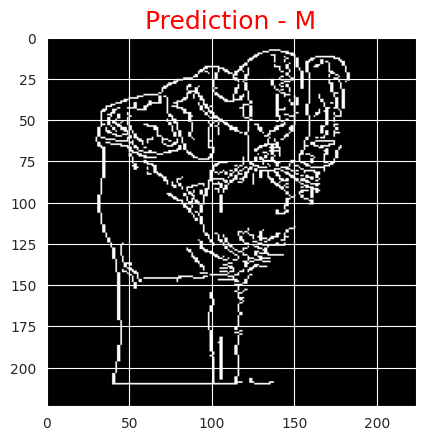

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


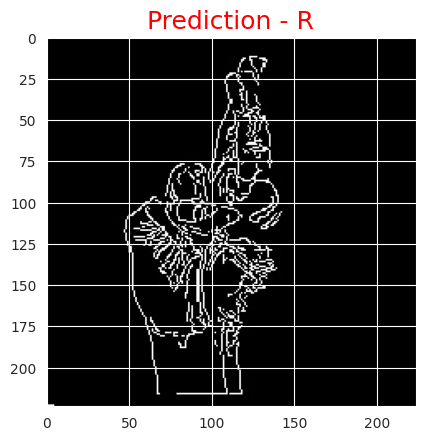

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 24ms/step


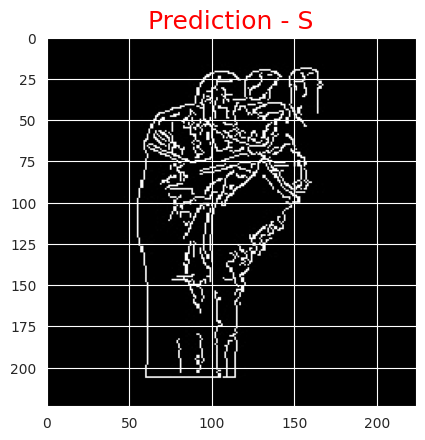

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 23ms/step


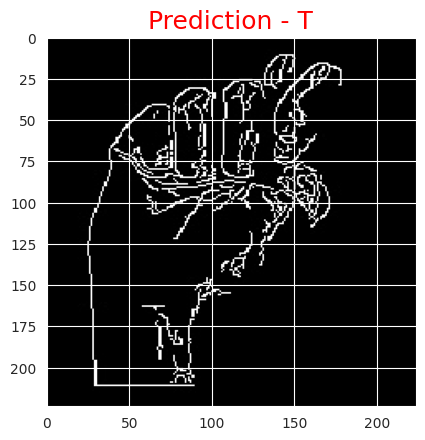

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


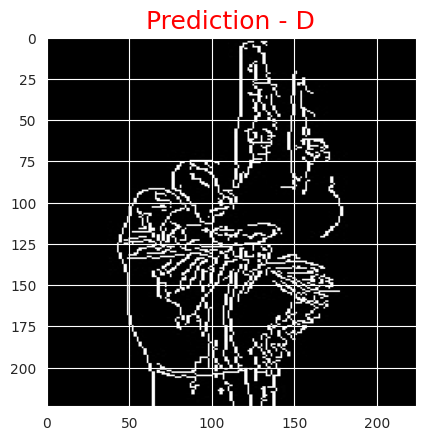

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


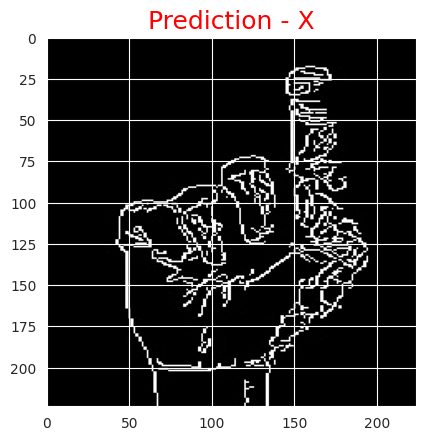

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 20ms/step


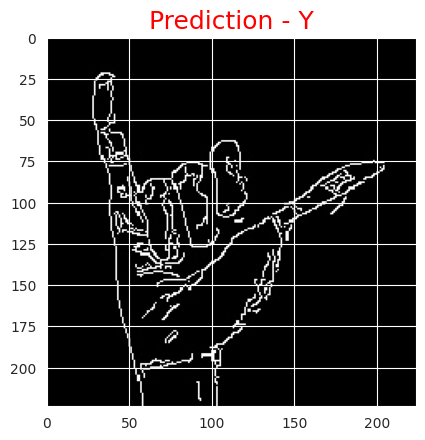

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_y_seg_1_cropped.jpeg', model)

# **MobileNetV2**

In [ ]:
model = model_mnetv2

1/1 [==============================] - 1s 758ms/step


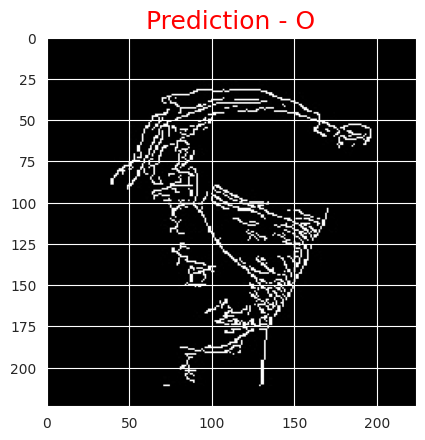

In [ ]:
pred_0 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_0_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 25ms/step


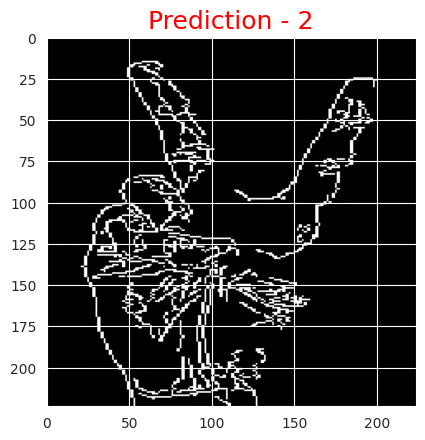

In [ ]:
pred_2 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_2_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


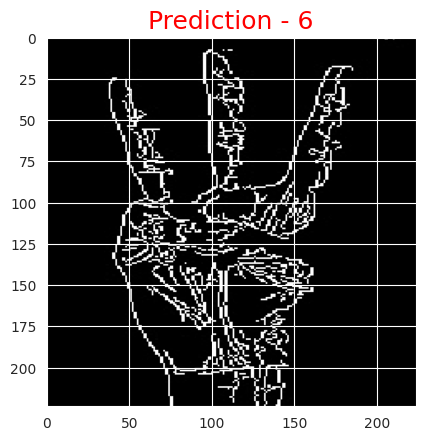

In [ ]:
pred_6 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_6_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


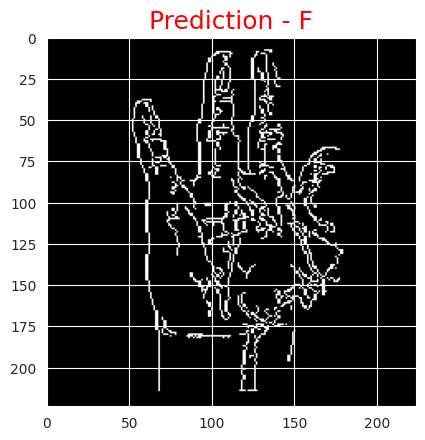

In [ ]:
pred_9 = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_9_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


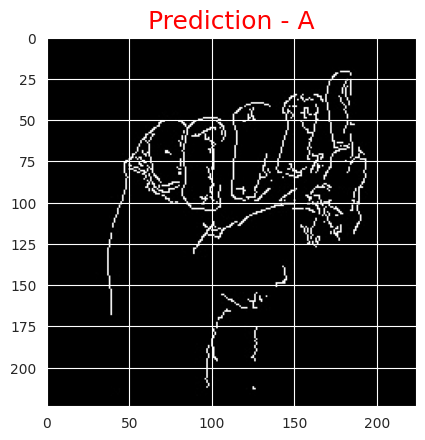

In [ ]:
pred_a = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_a_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 21ms/step


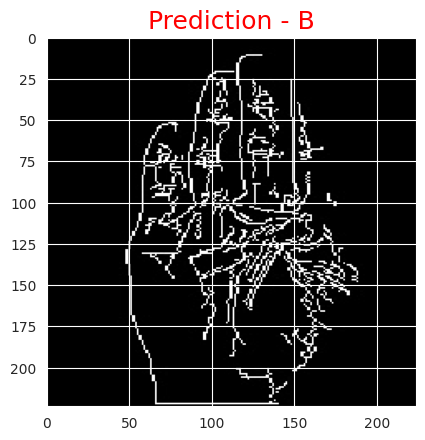

In [ ]:
pred_b = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_b_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


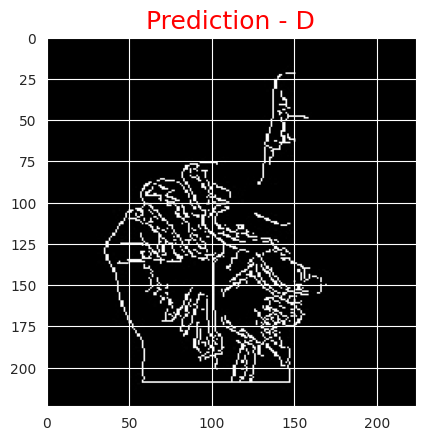

In [ ]:
pred_d = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_d_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


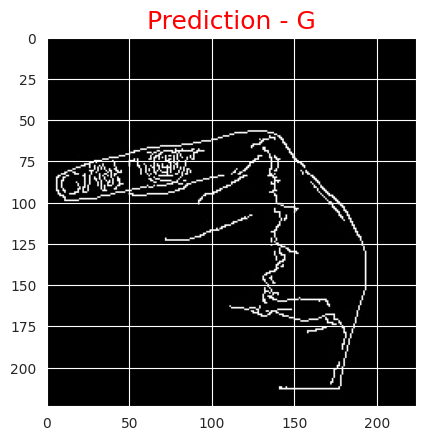

In [ ]:
pred_g = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_g_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


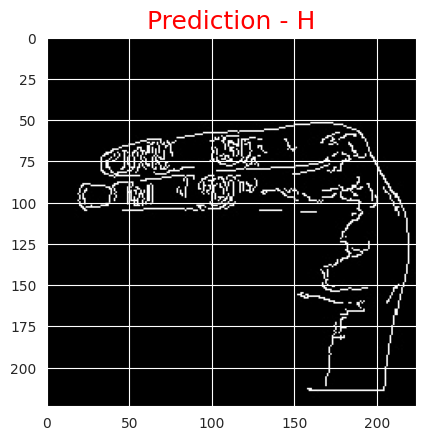

In [ ]:
pred_h = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_h_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


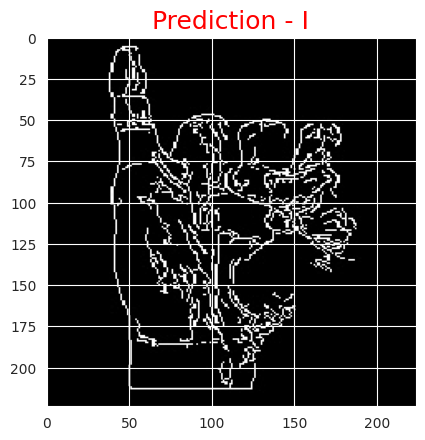

In [ ]:
pred_i = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_i_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 22ms/step


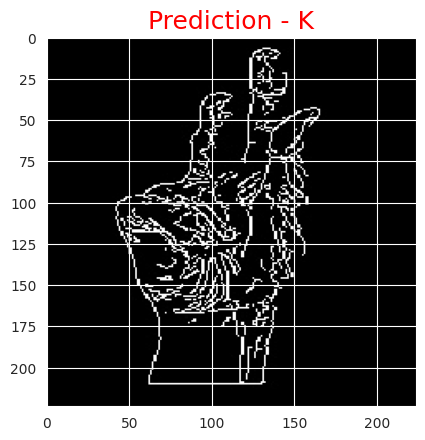

In [ ]:
pred_k = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_k_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 37ms/step


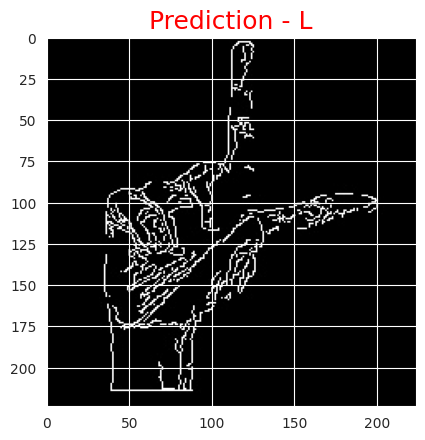

In [ ]:
pred_l = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_l_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 34ms/step


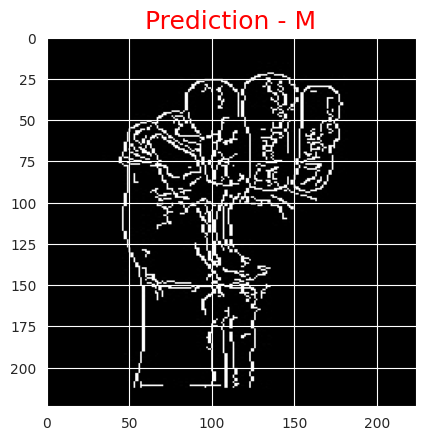

In [ ]:
pred_m = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_m_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


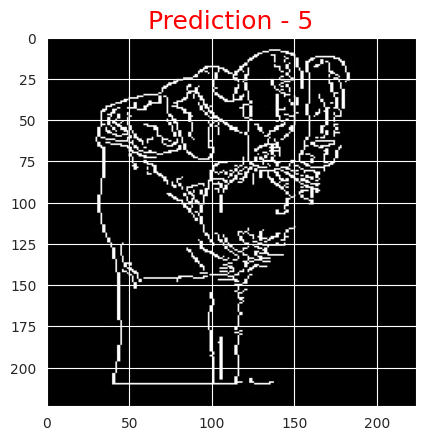

In [ ]:
pred_n = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_n_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


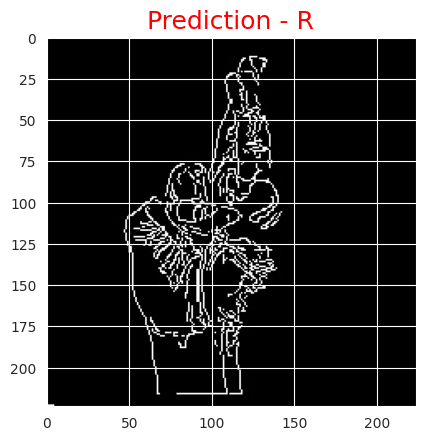

In [ ]:
pred_r = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_r_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 33ms/step


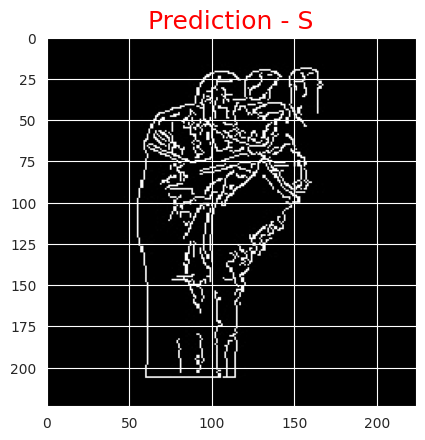

In [ ]:
pred_s = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_s_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 34ms/step


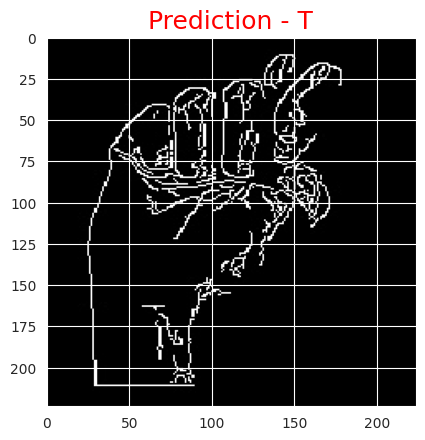

In [ ]:
pred_t = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_t_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 32ms/step


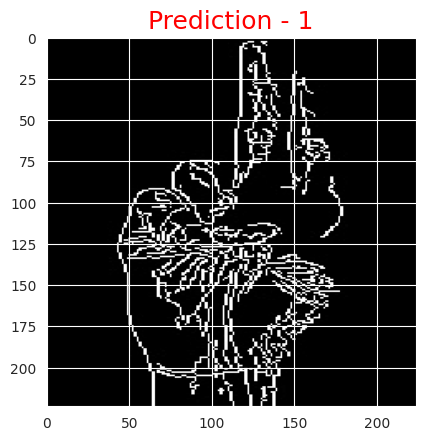

In [ ]:
pred_u = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_u_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 35ms/step


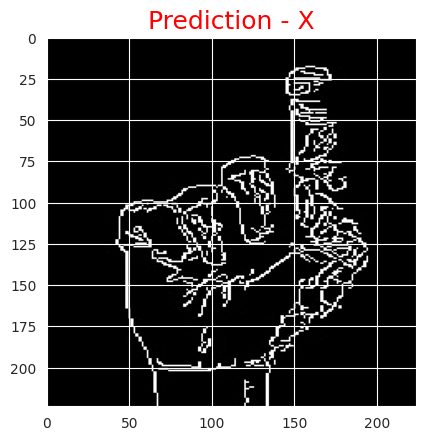

In [ ]:
pred_x = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_x_seg_1_cropped.jpeg', model)

1/1 [==============================] - 0s 31ms/step


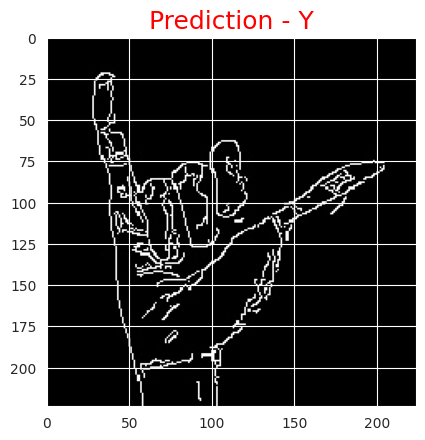

In [ ]:
pred_y = predict_image('/content/drive/MyDrive/Colab Notebooks/dataset/processed/canny/hand_y_seg_1_cropped.jpeg', model)